# 1. Import Libraries

In [4]:
import cv2   
import os
import math   
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
from keras.preprocessing import image   
import numpy as np    
from keras.utils import np_utils
from skimage.transform import resize  
from sklearn.model_selection import train_test_split
from glob import glob
from tqdm import tqdm

import keras
from keras.applications.vgg16 import VGG16
from keras.layers import Dense, InputLayer, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, GlobalMaxPooling2D
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.regularizers import l2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import classification_report


In [ ]:
os.chdir('desired_directory_for_video_frames')


directory = r'root_directory_where_train_video_data_is_stored'
for sub_dir_1 in os.listdir(directory):
    for sub_dir_2 in os.listdir(os.path.join(directory, sub_dir_1)):
        if str(sub_dir_2) in ['glasses', 'night_noglasses', 'nightglasses', 'noglasses', 'sunglasses']:
            for files in os.listdir(os.path.join(os.path.join(directory, sub_dir_1), sub_dir_2)):
                if str(files) in  ['nonsleepyCombination.avi', 'sleepyCombination.avi', 'slowBlinkWithNodding.avi', 'yawning.avi']:
                    txt_file = str(directory) + '\\' + str(sub_dir_1) + '\\' + str(sub_dir_2) + '\\' + str(sub_dir_1) + '_' + str(files[:-4]) + '_drowsiness.txt'
                    file = open(txt_file, 'r') 
                    n = 0
                    temp = []
                    while True: 
                        char = file.read(1)           
                        if not char:  
                            break
                        n = n+1
                        temp.append(char)
                    file.close()
                    cam = cv2.VideoCapture(str(directory) + '\\' + str(sub_dir_1) + '\\' + str(sub_dir_2) + '\\' + files) 
                    currentframe = 0

                    while(True): 
                        ret,frame = cam.read() 
                        if ret: 
                            if temp[currentframe] == '1':
                                if not os.path.exists('train_data/drowsy'): 
                                    os.makedirs('train_data/drowsy')
                                name = './train_data/drowsy/' + str(sub_dir_1) + '_' + str(sub_dir_2) + '_' + str(files[:-4]) + '_' +str(currentframe) + '_' + 'drowsy' + '.jpg'
                            
                            if temp[currentframe] == '0':
                                if not os.path.exists('train_data/notdrowsy'): 
                                    os.makedirs('train_data/notdrowsy')
                                name = './train_data/notdrowsy/' + str(sub_dir_1) + '_' + str(sub_dir_2) + '_' + str(files[:-4]) + '_' +str(currentframe) + '_' + 'notdrowsy' + '.jpg'
                                
                            print ('Creating...' + name) 
                            cv2.imwrite(name, frame) 
                            currentframe += 1
                        else: 
                            break
                    cam.release() 
                    cv2.destroyAllWindows() 


# 2.b. Video-to-Image Data Preparation (Test)

In [94]:
directory = r'root_directory_where_test_video_data_is_stored'
for sub_dir_1 in os.listdir(directory):

    for files in os.listdir(os.path.join(directory, sub_dir_1)):
        
        if str(files) in  [sub_dir_1+'_'+'glasses_mix.mp4', sub_dir_1+'_'+'nightglasses_mix.mp4', 
                           sub_dir_1+'_'+'nightnoglasses_mix.mp4', sub_dir_1+'_'+'noglasses_mix.mp4', sub_dir_1+'_'+'sunglasses_mix.mp4']:
            txt_file = str(directory) + '\\' + str(sub_dir_1) + '\\' + str(files[:-4]) + 'ing_drowsiness.txt'
            file = open(txt_file, 'r') 
            n = 0
            temp = []
            while True: 
                char = file.read(1)           
                if not char:  
                    break
                n = n+1
                temp.append(char)
            file.close()
            cam = cv2.VideoCapture(str(directory) + '\\' + str(sub_dir_1) + '\\' + files) 
            currentframe = 0
            while(True): 
                ret,frame = cam.read() 
                if ret: 
                    if temp[currentframe] == '1':
                        if not os.path.exists('val_data/drowsy'): 
                            os.makedirs('val_data/drowsy')
                        name = './val_data/drowsy/' + str(sub_dir_1) + '_' + str(files[:-4]) + '_' +str(currentframe) + '_' + 'drowsy' + '.jpg'

                    if temp[currentframe] == '0':
                        if not os.path.exists('val_data/notdrowsy'): 
                            os.makedirs('val_data/notdrowsy')
                        name = './val_data/notdrowsy/' + str(sub_dir_1) + '_' + str(files[:-4]) + '_' +str(currentframe) + '_' + 'notdrowsy' + '.jpg'

                    print ('Creating...' + name) 
                    cv2.imwrite(name, frame) 
                    currentframe += 1
                else: 
                    break
            cam.release() 
            cv2.destroyAllWindows() 


Creating..../val_data/notdrowsy/004_004_glasses_mix_0_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_1_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_2_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_3_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_4_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_5_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_6_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_7_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_8_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_9_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_10_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_11_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_12_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_13_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glas

Creating..../val_data/notdrowsy/004_004_glasses_mix_235_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_236_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_237_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_238_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_239_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_240_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_241_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_242_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_243_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_244_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_245_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_246_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_247_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_glasses_mix_248_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_glasses_mix_487_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_488_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_489_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_490_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_491_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_492_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_493_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_494_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_495_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_496_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_497_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_498_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_499_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_500_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_501_drowsy.jpg
Creating..../val_data/drowsy/004_004_gla

Creating..../val_data/drowsy/004_004_glasses_mix_743_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_744_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_745_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_746_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_747_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_748_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_749_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_750_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_751_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_752_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_753_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_754_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_755_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_756_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_757_drowsy.jpg
Creating..../val_data/drowsy/004_004_gla

Creating..../val_data/drowsy/004_004_glasses_mix_999_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1000_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1001_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1002_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1003_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1004_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1005_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1006_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1007_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1008_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1009_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1010_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1011_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1012_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1013_drowsy.jpg
Creating..../val_data/drow

Creating..../val_data/drowsy/004_004_glasses_mix_1251_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1252_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1253_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1254_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1255_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1256_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1257_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1258_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1259_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1260_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1261_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1262_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1263_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1264_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1265_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_1503_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1504_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1505_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1506_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1507_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1508_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1509_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1510_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1511_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1512_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1513_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1514_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1515_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1516_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1517_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_1755_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1756_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1757_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1758_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1759_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1760_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1761_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1762_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1763_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1764_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1765_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1766_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1767_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1768_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_1769_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_2007_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2008_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2009_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2010_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2011_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2012_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2013_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2014_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2015_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2016_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2017_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2018_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2019_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2020_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2021_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_2259_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2260_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2261_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2262_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2263_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2264_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2265_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2266_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2267_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2268_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2269_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2270_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2271_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2272_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2273_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_2511_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2512_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2513_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2514_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2515_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2516_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2517_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2518_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2519_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2520_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2521_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2522_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2523_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2524_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2525_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_2763_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2764_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2765_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2766_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2767_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2768_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2769_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2770_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2771_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2772_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2773_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2774_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2775_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2776_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_2777_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/004_004_glasses_mix_3015_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3016_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3017_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3018_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3019_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3020_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3021_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3022_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3023_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3024_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3025_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3026_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3027_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3028_drowsy.jpg
Creating..../val_data/drowsy/004_004_glasses_mix_3029_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_191_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_192_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_193_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_194_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_195_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_196_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_197_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_198_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_199_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_200_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_201_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_202_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_203_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_409_notdrowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_410_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_411_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_412_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_413_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_414_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_415_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_416_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_417_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_418_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_419_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_420_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_421_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_422_drowsy.jpg
Creating..../val_data/drowsy

Creating..../val_data/drowsy/004_004_nightglasses_mix_645_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_646_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_647_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_648_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_649_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_650_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_651_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_652_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_653_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_654_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_655_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_656_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_657_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_658_drowsy.jpg
Creating..../val_data/drowsy/004_0

Creating..../val_data/drowsy/004_004_nightglasses_mix_881_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_882_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_883_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_884_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_885_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_886_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_887_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_888_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_889_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_890_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_891_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_892_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_893_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_894_drowsy.jpg
Creating..../val_data/drowsy/004_0

Creating..../val_data/drowsy/004_004_nightglasses_mix_1116_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1117_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1118_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1119_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1120_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1121_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1122_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1123_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1124_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1125_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1126_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1127_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1128_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1129_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_1350_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1351_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1352_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1353_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1354_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1355_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1356_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1357_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1358_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1359_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1360_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1361_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1362_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1363_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_1584_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1585_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1586_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1587_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1588_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1589_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1590_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1591_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1592_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1593_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1594_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1595_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1596_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1597_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_1818_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1819_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1820_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1821_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1822_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1823_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1824_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1825_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1826_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1827_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1828_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1829_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1830_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_1831_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_2052_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2053_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2054_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2055_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2056_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2057_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2058_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2059_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2060_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2061_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2062_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2063_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2064_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2065_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_2286_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2287_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2288_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2289_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2290_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2291_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2292_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2293_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2294_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2295_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2296_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2297_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2298_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2299_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_2520_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2521_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2522_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2523_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2524_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2525_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2526_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2527_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2528_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2529_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2530_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2531_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2532_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2533_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/004_004_nightglasses_mix_2754_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2755_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2756_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2757_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2758_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2759_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2760_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2761_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2762_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2763_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2764_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2765_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2766_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightglasses_mix_2767_drowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2971_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2972_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2973_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2974_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2975_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2976_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2977_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2978_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2979_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2980_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2981_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2982_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_2983_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3185_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3186_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3187_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3188_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3189_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3190_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3191_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3192_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3193_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3194_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3195_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3196_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3197_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3399_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3400_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3401_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3402_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3403_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3404_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3405_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3406_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3407_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3408_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3409_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3410_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3411_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3613_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3614_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3615_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3616_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3617_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3618_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3619_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3620_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3621_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3622_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3623_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3624_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3625_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3827_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3828_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3829_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3830_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3831_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3832_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3833_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3834_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3835_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3836_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3837_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3838_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_3839_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4041_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4042_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4043_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4044_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4045_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4046_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4047_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4048_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4049_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4050_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4051_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4052_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4053_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4255_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4256_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4257_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4258_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4259_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4260_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4261_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4262_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4263_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4264_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4265_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4266_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4267_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4469_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4470_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4471_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4472_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4473_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4474_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4475_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4476_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4477_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4478_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4479_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4480_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4481_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4683_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4684_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4685_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4686_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4687_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4688_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4689_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4690_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4691_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4692_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4693_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4694_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4695_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4897_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4898_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4899_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4900_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4901_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4902_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4903_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4904_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4905_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4906_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4907_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4908_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_4909_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5111_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5112_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5113_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5114_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5115_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5116_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5117_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5118_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5119_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5120_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5121_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5122_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5123_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5325_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5326_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5327_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5328_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5329_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5330_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5331_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5332_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5333_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5334_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5335_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5336_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightglasses_mix_5337_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_141_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_142_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_143_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_144_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_145_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_146_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_147_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_148_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_149_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_150_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_151_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_152_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_153_notdrowsy.jpg

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_353_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_354_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_355_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_356_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_357_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_358_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_359_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_360_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_361_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_362_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_363_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_364_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_365_notdrowsy.jpg

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_565_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_566_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_567_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_568_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_569_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_570_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_571_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_572_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_573_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_574_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_575_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_576_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_577_notdrowsy.jpg

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_777_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_778_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_779_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_780_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_781_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_782_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_783_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_784_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_785_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_786_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_787_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_788_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_789_notdrowsy.jpg

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_989_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_990_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_991_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_992_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_993_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_994_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_995_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_996_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_997_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_998_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_999_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1000_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1001_notdrowsy.j

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1199_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1200_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1201_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1202_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1203_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1204_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1205_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1206_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1207_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1208_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1209_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1210_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1211_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1409_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1410_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1411_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1412_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1413_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1414_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1415_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1416_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1417_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1418_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1419_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1420_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1421_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1619_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1620_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1621_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1622_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1623_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1624_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1625_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1626_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1627_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1628_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1629_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1630_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1631_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1829_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1830_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1831_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1832_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1833_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1834_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1835_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1836_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1837_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1838_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1839_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1840_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_1841_

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2042_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2043_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2044_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2045_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2046_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2047_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2048_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2049_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2050_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2051_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2052_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2053_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2054_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2055_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2268_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2269_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2270_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2271_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2272_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2273_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2274_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2275_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2276_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2277_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2278_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2279_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2280_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2281_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2494_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2495_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2496_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2497_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2498_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2499_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2500_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2501_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2502_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2503_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2504_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2505_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2506_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2507_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2720_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2721_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2722_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2723_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2724_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2725_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2726_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2727_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2728_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2729_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2730_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2731_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2732_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2733_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2946_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2947_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2948_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2949_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2950_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2951_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2952_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2953_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2954_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2955_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2956_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2957_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2958_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_2959_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3172_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3173_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3174_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3175_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3176_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3177_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3178_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3179_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3180_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3181_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3182_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3183_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3184_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3185_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3398_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3399_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3400_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3401_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3402_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3403_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3404_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3405_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3406_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3407_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3408_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3409_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3410_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3411_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3624_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3625_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3626_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3627_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3628_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3629_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3630_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3631_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3632_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3633_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3634_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3635_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3636_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3637_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3850_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3851_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3852_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3853_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3854_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3855_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3856_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3857_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3858_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3859_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3860_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3861_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3862_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_3863_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4076_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4077_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4078_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4079_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4080_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4081_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4082_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4083_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4084_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4085_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4086_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4087_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4088_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4089_dro

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4297_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4298_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4299_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4300_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4301_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4302_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4303_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4304_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4305_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4306_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4307_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4308_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4309_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4507_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4508_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4509_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4510_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4511_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4512_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4513_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4514_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4515_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4516_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4517_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4518_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_4519_

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4731_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4732_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4733_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4734_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4735_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4736_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4737_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4738_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4739_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4740_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4741_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4742_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4743_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4744_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4957_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4958_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4959_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4960_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4961_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4962_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4963_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4964_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4965_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4966_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4967_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4968_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4969_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_4970_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5183_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5184_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5185_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5186_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5187_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5188_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5189_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5190_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5191_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5192_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5193_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5194_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5195_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5196_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5409_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5410_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5411_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5412_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5413_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5414_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5415_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5416_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5417_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5418_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5419_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5420_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5421_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5422_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5635_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5636_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5637_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5638_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5639_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5640_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5641_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5642_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5643_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5644_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5645_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5646_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5647_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5648_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5861_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5862_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5863_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5864_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5865_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5866_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5867_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5868_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5869_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5870_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5871_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5872_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5873_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_5874_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6087_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6088_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6089_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6090_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6091_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6092_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6093_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6094_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6095_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6096_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6097_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6098_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6099_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6100_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6313_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6314_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6315_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6316_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6317_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6318_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6319_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6320_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6321_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6322_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6323_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6324_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6325_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6326_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6539_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6540_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6541_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6542_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6543_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6544_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6545_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6546_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6547_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6548_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6549_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6550_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6551_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6552_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6765_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6766_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6767_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6768_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6769_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6770_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6771_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6772_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6773_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6774_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6775_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6776_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6777_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6778_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6991_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6992_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6993_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6994_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6995_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6996_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6997_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6998_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_6999_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7000_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7001_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7002_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7003_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7004_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7217_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7218_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7219_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7220_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7221_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7222_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7223_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7224_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7225_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7226_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7227_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7228_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7229_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7230_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7443_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7444_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7445_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7446_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7447_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7448_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7449_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7450_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7451_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7452_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7453_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7454_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7455_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7456_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7669_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7670_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7671_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7672_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7673_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7674_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7675_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7676_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7677_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7678_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7679_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7680_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7681_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7682_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7895_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7896_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7897_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7898_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7899_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7900_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7901_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7902_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7903_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7904_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7905_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7906_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7907_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_7908_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8121_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8122_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8123_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8124_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8125_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8126_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8127_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8128_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8129_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8130_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8131_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8132_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8133_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8134_dro

Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8347_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8348_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8349_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8350_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8351_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8352_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8353_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8354_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8355_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8356_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8357_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8358_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8359_drowsy.jpg
Creating..../val_data/drowsy/004_004_nightnoglasses_mix_8360_dro

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8568_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8569_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8570_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8571_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8572_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8573_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8574_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8575_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8576_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8577_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8578_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8579_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8580_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8778_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8779_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8780_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8781_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8782_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8783_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8784_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8785_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8786_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8787_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8788_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8789_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8790_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8988_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8989_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8990_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8991_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8992_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8993_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8994_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8995_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8996_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8997_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8998_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_8999_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9000_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9198_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9199_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9200_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9201_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9202_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9203_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9204_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9205_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9206_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9207_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9208_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9209_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9210_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9408_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9409_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9410_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9411_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9412_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9413_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9414_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9415_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9416_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9417_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9418_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9419_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9420_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9618_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9619_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9620_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9621_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9622_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9623_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9624_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9625_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9626_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9627_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9628_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9629_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9630_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9828_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9829_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9830_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9831_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9832_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9833_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9834_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9835_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9836_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9837_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9838_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9839_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_9840_

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10037_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10038_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10039_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10040_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10041_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10042_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10043_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10044_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10045_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10046_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10047_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10048_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10243_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10244_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10245_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10246_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10247_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10248_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10249_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10250_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10251_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10252_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10253_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10254_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10449_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10450_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10451_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10452_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10453_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10454_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10455_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10456_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10457_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10458_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10459_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10460_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10655_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10656_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10657_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10658_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10659_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10660_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10661_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10662_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10663_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10664_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10665_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10666_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10861_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10862_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10863_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10864_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10865_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10866_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10867_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10868_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10869_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10870_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10871_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_10872_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11067_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11068_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11069_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11070_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11071_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11072_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11073_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11074_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11075_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11076_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11077_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11078_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11273_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11274_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11275_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11276_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11277_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11278_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11279_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11280_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11281_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11282_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11283_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11284_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11479_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11480_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11481_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11482_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11483_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11484_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11485_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11486_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11487_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11488_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11489_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11490_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11685_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11686_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11687_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11688_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11689_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11690_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11691_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11692_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11693_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11694_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11695_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglasses_mix_11696_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_nightnoglass

Creating..../val_data/notdrowsy/004_004_noglasses_mix_181_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_182_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_183_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_184_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_185_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_186_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_187_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_188_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_189_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_190_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_191_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_192_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_193_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_194_notdro

Creating..../val_data/notdrowsy/004_004_noglasses_mix_407_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_408_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_409_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_410_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_411_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_412_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_413_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_414_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_415_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_416_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_417_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_418_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_419_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_420_notdro

Creating..../val_data/notdrowsy/004_004_noglasses_mix_633_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_634_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_635_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_636_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_637_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_638_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_639_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_640_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_641_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_642_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_643_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_644_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_645_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_646_notdro

Creating..../val_data/notdrowsy/004_004_noglasses_mix_859_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_860_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_861_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_862_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_863_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_864_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_865_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_866_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_867_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_868_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_869_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_870_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_871_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_872_notdro

Creating..../val_data/notdrowsy/004_004_noglasses_mix_1084_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1085_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1086_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1087_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1088_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1089_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1090_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1091_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1092_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1093_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1094_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1095_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1096_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_1308_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1309_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1310_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1311_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1312_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1313_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1314_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1315_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1316_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1317_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1318_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1319_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1320_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_1532_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1533_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1534_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1535_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1536_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1537_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1538_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1539_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1540_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1541_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1542_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1543_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1544_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_1756_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1757_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1758_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1759_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1760_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1761_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1762_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1763_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1764_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1765_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1766_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1767_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1768_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_1980_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1981_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1982_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1983_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1984_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1985_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1986_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1987_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1988_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1989_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1990_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1991_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_1992_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_2204_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2205_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2206_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2207_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2208_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2209_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2210_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2211_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2212_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2213_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2214_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2215_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2216_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_2428_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2429_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2430_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2431_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2432_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2433_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2434_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2435_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2436_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2437_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2438_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2439_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_2440_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/drowsy/004_004_noglasses_mix_2656_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2657_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2658_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2659_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2660_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2661_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2662_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2663_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2664_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2665_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2666_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2667_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2668_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2669_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2670_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_2900_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2901_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2902_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2903_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2904_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2905_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2906_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2907_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2908_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2909_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2910_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2911_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2912_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2913_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_2914_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_3144_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3145_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3146_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3147_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3148_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3149_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3150_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3151_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3152_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3153_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3154_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3155_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3156_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3157_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3158_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_3388_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3389_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3390_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3391_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3392_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3393_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3394_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3395_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3396_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3397_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3398_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3399_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3400_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3401_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3402_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_3632_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3633_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3634_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3635_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3636_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3637_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3638_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3639_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3640_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3641_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3642_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3643_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3644_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3645_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3646_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_3876_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3877_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3878_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3879_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3880_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3881_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3882_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3883_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3884_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3885_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3886_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3887_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3888_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3889_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_3890_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_4120_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4121_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4122_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4123_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4124_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4125_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4126_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4127_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4128_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4129_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4130_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4131_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4132_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4133_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4134_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_4364_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4365_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4366_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4367_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4368_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4369_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4370_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4371_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4372_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4373_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4374_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4375_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4376_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4377_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4378_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_4608_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4609_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4610_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4611_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4612_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4613_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4614_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4615_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4616_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4617_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4618_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4619_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4620_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4621_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4622_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_4852_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4853_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4854_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4855_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4856_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4857_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4858_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_4859_drowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4860_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4861_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4862_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4863_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4864_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_4865_notdrowsy.jpg
Creating..../val_data/notd

Creating..../val_data/notdrowsy/004_004_noglasses_mix_5076_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5077_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5078_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5079_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5080_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5081_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5082_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5083_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5084_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5085_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5086_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5087_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5088_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_5300_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5301_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5302_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5303_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5304_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5305_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5306_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5307_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5308_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5309_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5310_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5311_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5312_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_5524_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5525_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5526_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5527_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5528_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5529_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5530_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5531_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5532_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5533_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5534_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5535_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5536_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_5748_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5749_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5750_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5751_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5752_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5753_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5754_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5755_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5756_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5757_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5758_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5759_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5760_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_5972_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5973_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5974_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5975_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5976_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5977_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5978_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5979_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5980_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5981_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5982_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5983_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_5984_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_6196_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6197_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6198_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6199_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6200_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6201_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6202_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6203_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6204_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6205_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6206_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6207_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6208_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_6420_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6421_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6422_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6423_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6424_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6425_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6426_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6427_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6428_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6429_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6430_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6431_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6432_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_6644_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6645_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6646_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6647_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6648_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6649_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6650_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6651_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6652_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6653_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6654_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6655_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6656_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_6868_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6869_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6870_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6871_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6872_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6873_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6874_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6875_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6876_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6877_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6878_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6879_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_6880_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_7092_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7093_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7094_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7095_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7096_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7097_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7098_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7099_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7100_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7101_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7102_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7103_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7104_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/notdrowsy/004_004_noglasses_mix_7316_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7317_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7318_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7319_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7320_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7321_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7322_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7323_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7324_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7325_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7326_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7327_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_mix_7328_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_noglasses_m

Creating..../val_data/drowsy/004_004_noglasses_mix_7549_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7550_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7551_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7552_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7553_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7554_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7555_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7556_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7557_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7558_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7559_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7560_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7561_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7562_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7563_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_7793_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7794_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7795_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7796_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7797_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7798_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7799_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7800_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7801_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7802_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7803_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7804_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7805_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7806_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_7807_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_8037_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8038_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8039_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8040_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8041_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8042_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8043_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8044_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8045_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8046_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8047_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8048_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8049_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8050_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8051_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_8281_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8282_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8283_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8284_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8285_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8286_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8287_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8288_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8289_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8290_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8291_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8292_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8293_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8294_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8295_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_8525_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8526_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8527_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8528_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8529_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8530_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8531_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8532_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8533_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8534_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8535_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8536_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8537_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8538_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8539_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_8769_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8770_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8771_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8772_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8773_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8774_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8775_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8776_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8777_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8778_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8779_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8780_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8781_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8782_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_8783_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_9013_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9014_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9015_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9016_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9017_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9018_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9019_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9020_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9021_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9022_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9023_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9024_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9025_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9026_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9027_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_9257_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9258_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9259_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9260_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9261_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9262_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9263_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9264_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9265_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9266_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9267_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9268_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9269_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9270_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9271_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_9501_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9502_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9503_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9504_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9505_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9506_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9507_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9508_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9509_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9510_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9511_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9512_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9513_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9514_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9515_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_9745_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9746_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9747_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9748_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9749_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9750_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9751_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9752_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9753_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9754_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9755_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9756_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9757_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9758_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9759_drowsy

Creating..../val_data/drowsy/004_004_noglasses_mix_9989_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9990_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9991_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9992_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9993_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9994_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9995_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9996_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9997_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9998_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_9999_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_10000_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_10001_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_10002_drowsy.jpg
Creating..../val_data/drowsy/004_004_noglasses_mix_10003_dr

Creating..../val_data/notdrowsy/004_004_sunglasses_mix_23_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_24_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_25_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_26_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_27_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_28_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_29_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_30_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_31_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_32_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_33_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_34_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_35_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_36_notdro

Creating..../val_data/notdrowsy/004_004_sunglasses_mix_248_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_249_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_250_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_251_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_252_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_253_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_254_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_255_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_256_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_257_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_258_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_259_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_mix_260_notdrowsy.jpg
Creating..../val_data/notdrowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_484_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_485_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_486_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_487_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_488_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_489_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_490_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_491_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_492_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_493_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_494_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_495_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_496_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_497_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_498_drowsy

Creating..../val_data/drowsy/004_004_sunglasses_mix_728_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_729_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_730_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_731_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_732_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_733_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_734_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_735_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_736_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_737_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_738_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_739_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_740_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_741_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_742_drowsy

Creating..../val_data/drowsy/004_004_sunglasses_mix_972_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_973_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_974_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_975_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_976_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_977_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_978_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_979_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_980_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_981_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_982_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_983_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_984_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_985_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_986_drowsy

Creating..../val_data/drowsy/004_004_sunglasses_mix_1212_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1213_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1214_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1215_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1216_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1217_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1218_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1219_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1220_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1221_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1222_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1223_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1224_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1225_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_1452_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1453_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1454_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1455_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1456_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1457_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1458_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1459_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1460_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1461_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1462_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1463_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1464_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1465_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_1692_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1693_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1694_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1695_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1696_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1697_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1698_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1699_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1700_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1701_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1702_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1703_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1704_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1705_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_1932_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1933_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1934_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1935_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1936_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1937_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1938_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1939_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1940_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1941_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1942_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1943_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1944_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_1945_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_2172_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2173_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2174_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2175_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2176_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2177_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2178_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2179_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2180_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2181_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2182_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2183_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2184_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2185_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_2412_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2413_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2414_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2415_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2416_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2417_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2418_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2419_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2420_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2421_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2422_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2423_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2424_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2425_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_2652_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2653_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2654_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2655_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2656_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2657_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2658_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2659_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2660_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2661_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2662_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2663_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2664_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2665_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_2892_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2893_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2894_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2895_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2896_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2897_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2898_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2899_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2900_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2901_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2902_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2903_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2904_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_2905_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_3132_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3133_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3134_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3135_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3136_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3137_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3138_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3139_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3140_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3141_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3142_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3143_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3144_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3145_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/drowsy/004_004_sunglasses_mix_3372_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3373_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3374_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3375_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3376_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3377_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3378_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3379_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3380_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3381_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3382_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3383_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3384_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_mix_3385_drowsy.jpg
Creating..../val_data/drowsy/004_004_sunglasses_

Creating..../val_data/notdrowsy/022_022_glasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_107_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_108_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_109_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_110_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_111_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_112_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_113_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_114_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_115_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_116_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_117_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_118_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_glasses_mix_339_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_340_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_341_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_342_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_343_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_344_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_345_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_346_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_347_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_348_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_349_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_350_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_351_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_352_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_glasses_mix_573_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_574_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_575_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_576_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_577_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_578_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_579_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_580_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_581_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_582_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_583_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_584_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_585_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_586_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_glasses_mix_807_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_808_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_809_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_810_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_811_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_812_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_813_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_814_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_815_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_816_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_817_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_818_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_819_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_820_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_glasses_mix_1040_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1041_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1042_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1043_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1044_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1045_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1046_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1047_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1048_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1049_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1050_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1051_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1052_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1053_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_1270_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1271_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1272_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1273_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1274_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1275_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1276_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1277_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1278_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1279_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1280_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1281_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1282_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1283_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_1500_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1501_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1502_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1503_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1504_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1505_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1506_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1507_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1508_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1509_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1510_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1511_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1512_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1513_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_1730_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1731_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1732_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1733_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1734_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1735_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1736_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1737_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1738_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1739_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1740_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1741_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1742_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1743_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_1960_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1961_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1962_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1963_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1964_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1965_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1966_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1967_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1968_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1969_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1970_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1971_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1972_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_1973_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_2190_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2191_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2192_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2193_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2194_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2195_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2196_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2197_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2198_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2199_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2200_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2201_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2202_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2203_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_glasses_mix_2420_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2421_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2422_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2423_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2424_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2425_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2426_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2427_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2428_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2429_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2430_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2431_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2432_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_glasses_mix_2433_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_94_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_95_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_96_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_97_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_98_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_99_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_100_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_101_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_102_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_103_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_104_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdrowsy

Creating..../val_data/drowsy/022_022_nightglasses_mix_320_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_321_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_322_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_323_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_324_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_325_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_326_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_327_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_328_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_329_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_330_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_331_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_332_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_333_drowsy.jpg
Creating..../val_data/drowsy/022_0

Creating..../val_data/drowsy/022_022_nightglasses_mix_556_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_557_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_558_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_559_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_560_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_561_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_562_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_563_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_564_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_565_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_566_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_567_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_568_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_569_drowsy.jpg
Creating..../val_data/drowsy/022_0

Creating..../val_data/drowsy/022_022_nightglasses_mix_792_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_793_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_794_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_795_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_796_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_797_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_798_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_799_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_800_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_801_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_802_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_803_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_804_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_805_drowsy.jpg
Creating..../val_data/drowsy/022_0

Creating..../val_data/drowsy/022_022_nightglasses_mix_1028_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1029_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1030_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1031_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1032_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1033_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1034_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1035_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1036_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1037_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1038_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1039_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1040_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1041_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_1262_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1263_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1264_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1265_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1266_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1267_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1268_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1269_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1270_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1271_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1272_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1273_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1274_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1275_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_1496_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1497_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1498_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1499_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1500_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1501_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1502_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1503_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1504_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1505_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1506_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1507_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1508_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1509_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_1730_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1731_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1732_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1733_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1734_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1735_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1736_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1737_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1738_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1739_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1740_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1741_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1742_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_1743_drowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1953_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1954_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1955_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1956_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1957_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1958_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1959_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1960_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1961_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1962_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1963_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1964_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_1965_notdrowsy.jpg
Creating....

Creating..../val_data/drowsy/022_022_nightglasses_mix_2175_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2176_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2177_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2178_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2179_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2180_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2181_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2182_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2183_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2184_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2185_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2186_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2187_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2188_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_2409_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2410_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2411_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2412_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2413_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2414_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2415_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2416_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2417_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2418_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2419_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2420_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2421_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2422_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_2643_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2644_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2645_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2646_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2647_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2648_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2649_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2650_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2651_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2652_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2653_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2654_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2655_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2656_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_2877_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2878_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2879_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2880_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2881_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2882_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2883_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2884_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2885_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2886_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2887_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2888_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2889_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_2890_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_3111_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3112_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3113_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3114_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3115_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3116_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3117_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3118_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3119_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3120_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3121_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3122_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3123_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3124_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/022_022_nightglasses_mix_3345_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3346_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3347_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3348_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3349_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3350_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3351_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3352_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3353_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3354_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3355_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3356_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3357_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightglasses_mix_3358_drowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3575_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3576_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3577_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3578_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3579_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3580_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3581_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3582_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3583_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3584_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3585_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3586_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3587_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3789_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3790_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3791_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3792_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3793_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3794_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3795_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3796_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3797_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3798_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3799_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3800_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_3801_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4003_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4004_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4005_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4006_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4007_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4008_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4009_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4010_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4011_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4012_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4013_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4014_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4015_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4217_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4218_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4219_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4220_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4221_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4222_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4223_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4224_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4225_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4226_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4227_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4228_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4229_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4431_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4432_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4433_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4434_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4435_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4436_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4437_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4438_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4439_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4440_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4441_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4442_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4443_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4645_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4646_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4647_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4648_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4649_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4650_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4651_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4652_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4653_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4654_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4655_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4656_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4657_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4859_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4860_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4861_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4862_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4863_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4864_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4865_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4866_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4867_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4868_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4869_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4870_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_4871_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5073_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5074_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5075_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5076_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5077_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5078_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5079_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5080_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5081_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5082_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5083_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5084_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5085_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5287_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5288_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5289_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5290_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5291_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5292_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5293_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5294_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5295_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5296_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5297_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5298_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5299_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5501_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5502_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5503_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5504_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5505_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5506_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5507_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5508_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5509_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5510_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5511_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5512_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5513_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5715_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5716_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5717_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5718_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5719_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5720_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5721_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5722_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5723_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5724_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5725_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5726_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5727_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5929_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5930_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5931_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5932_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5933_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5934_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5935_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5936_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5937_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5938_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5939_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5940_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_5941_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6143_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6144_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6145_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6146_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6147_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6148_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6149_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6150_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6151_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6152_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6153_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6154_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6155_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6357_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6358_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6359_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6360_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6361_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6362_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6363_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6364_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6365_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6366_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6367_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6368_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6369_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6571_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6572_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6573_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6574_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6575_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6576_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6577_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6578_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6579_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6580_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6581_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6582_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6583_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6785_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6786_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6787_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6788_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6789_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6790_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6791_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6792_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6793_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6794_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6795_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6796_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6797_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_6999_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7000_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7001_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7002_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7003_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7004_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7005_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7006_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7007_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7008_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7009_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7010_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7011_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7213_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7214_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7215_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7216_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7217_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7218_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7219_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7220_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7221_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7222_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7223_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7224_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7225_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7427_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7428_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7429_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7430_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7431_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7432_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7433_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7434_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7435_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7436_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7437_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7438_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7439_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7641_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7642_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7643_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7644_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7645_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7646_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7647_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7648_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7649_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7650_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7651_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7652_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7653_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7855_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7856_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7857_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7858_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7859_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7860_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7861_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7862_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7863_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7864_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7865_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7866_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_7867_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8069_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8070_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8071_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8072_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8073_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8074_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8075_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8076_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8077_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8078_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8079_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8080_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightglasses_mix_8081_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_81_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_82_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_83_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_84_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_85_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_86_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_87_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_88_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_89_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_90_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_91_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_92_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_93_notdrowsy.jpg
Creating....

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_304_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_305_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_306_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_307_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_308_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_309_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_310_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_311_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_312_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_313_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_314_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_315_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_316_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_317_drowsy.jpg
Creati

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_534_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_535_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_536_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_537_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_538_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_539_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_540_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_541_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_542_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_543_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_544_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_545_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_546_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_547_drowsy.jpg
Creati

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_764_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_765_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_766_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_767_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_768_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_769_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_770_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_771_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_772_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_773_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_774_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_775_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_776_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_777_drowsy.jpg
Creati

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_994_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_995_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_996_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_997_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_998_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_999_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1000_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1001_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1002_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1003_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1004_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1005_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1006_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1007_drowsy.jp

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1220_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1221_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1222_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1223_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1224_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1225_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1226_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1227_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1228_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1229_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1230_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1231_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1232_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1233_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1446_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1447_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1448_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1449_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1450_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1451_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1452_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1453_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1454_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1455_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1456_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1457_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1458_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1459_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1672_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1673_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1674_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1675_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1676_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1677_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1678_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1679_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1680_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1681_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1682_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1683_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1684_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1685_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1898_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1899_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1900_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1901_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1902_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1903_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1904_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1905_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1906_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1907_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1908_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1909_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1910_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_1911_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2124_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2125_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2126_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2127_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2128_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2129_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2130_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2131_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2132_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2133_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2134_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2135_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2136_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2137_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2350_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2351_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2352_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2353_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2354_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2355_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2356_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2357_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2358_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2359_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2360_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2361_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2362_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2363_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2576_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2577_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2578_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2579_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2580_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2581_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2582_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2583_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2584_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2585_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2586_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2587_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2588_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2589_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2802_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2803_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2804_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2805_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2806_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2807_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2808_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2809_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2810_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2811_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2812_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2813_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2814_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_2815_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3028_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3029_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3030_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3031_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3032_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3033_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3034_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3035_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3036_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3037_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3038_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3039_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3040_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3041_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3254_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3255_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3256_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3257_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3258_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3259_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3260_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3261_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3262_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3263_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3264_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3265_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3266_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_3267_dro

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3468_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3469_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3470_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3471_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3472_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3473_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3474_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3475_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3476_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3477_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3478_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3479_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3480_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3678_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3679_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3680_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3681_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3682_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3683_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3684_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3685_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3686_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3687_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3688_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3689_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3690_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3888_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3889_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3890_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3891_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3892_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3893_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3894_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3895_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3896_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3897_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3898_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3899_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_3900_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4098_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4099_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4100_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4101_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4102_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4103_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4104_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4105_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4106_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4107_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4108_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4109_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4110_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4308_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4309_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4310_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4311_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4312_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4313_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4314_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4315_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4316_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4317_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4318_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4319_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4320_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4518_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4519_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4520_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4521_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4522_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4523_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4524_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4525_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4526_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4527_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4528_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4529_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4530_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4728_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4729_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4730_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4731_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4732_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4733_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4734_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4735_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4736_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4737_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4738_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4739_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4740_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4938_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4939_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4940_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4941_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4942_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4943_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4944_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4945_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4946_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4947_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4948_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4949_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_4950_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5148_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5149_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5150_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5151_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5152_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5153_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5154_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5155_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5156_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5157_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5158_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5159_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5160_

Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5358_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5359_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5360_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5361_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5362_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5363_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5364_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5365_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5366_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5367_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5368_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5369_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_nightnoglasses_mix_5370_

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5574_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5575_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5576_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5577_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5578_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5579_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5580_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5581_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5582_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5583_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5584_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5585_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5586_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5587_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5800_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5801_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5802_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5803_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5804_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5805_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5806_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5807_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5808_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5809_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5810_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5811_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5812_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_5813_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6026_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6027_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6028_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6029_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6030_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6031_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6032_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6033_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6034_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6035_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6036_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6037_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6038_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6039_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6252_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6253_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6254_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6255_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6256_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6257_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6258_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6259_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6260_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6261_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6262_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6263_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6264_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6265_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6478_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6479_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6480_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6481_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6482_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6483_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6484_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6485_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6486_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6487_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6488_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6489_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6490_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6491_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6704_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6705_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6706_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6707_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6708_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6709_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6710_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6711_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6712_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6713_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6714_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6715_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6716_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6717_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6930_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6931_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6932_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6933_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6934_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6935_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6936_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6937_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6938_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6939_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6940_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6941_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6942_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_6943_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7156_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7157_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7158_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7159_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7160_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7161_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7162_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7163_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7164_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7165_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7166_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7167_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7168_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7169_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7382_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7383_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7384_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7385_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7386_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7387_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7388_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7389_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7390_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7391_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7392_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7393_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7394_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7395_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7608_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7609_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7610_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7611_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7612_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7613_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7614_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7615_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7616_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7617_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7618_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7619_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7620_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7621_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7834_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7835_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7836_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7837_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7838_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7839_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7840_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7841_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7842_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7843_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7844_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7845_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7846_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_7847_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8060_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8061_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8062_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8063_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8064_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8065_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8066_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8067_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8068_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8069_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8070_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8071_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8072_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8073_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8286_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8287_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8288_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8289_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8290_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8291_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8292_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8293_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8294_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8295_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8296_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8297_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8298_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8299_dro

Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8512_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8513_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8514_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8515_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8516_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8517_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8518_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8519_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8520_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8521_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8522_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8523_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8524_drowsy.jpg
Creating..../val_data/drowsy/022_022_nightnoglasses_mix_8525_dro

Creating..../val_data/notdrowsy/022_022_noglasses_mix_124_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_125_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_126_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_127_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_128_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_129_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_130_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_131_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_132_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_133_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_134_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_135_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_136_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_137_notdro

Creating..../val_data/drowsy/022_022_noglasses_mix_363_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_364_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_365_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_366_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_367_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_368_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_369_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_370_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_371_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_372_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_373_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_374_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_375_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_376_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_377_drowsy.jpg
Creating..

Creating..../val_data/drowsy/022_022_noglasses_mix_611_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_612_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_613_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_614_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_615_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_616_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_617_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_618_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_619_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_620_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_621_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_622_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_623_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_624_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_625_drowsy.jpg
Creating..

Creating..../val_data/drowsy/022_022_noglasses_mix_859_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_860_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_861_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_862_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_863_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_864_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_865_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_866_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_867_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_868_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_869_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_870_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_871_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_872_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_873_drowsy.jpg
Creating..

Creating..../val_data/drowsy/022_022_noglasses_mix_1105_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1106_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1107_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1108_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1109_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1110_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1111_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1112_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1113_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1114_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1115_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1116_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1117_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1118_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1119_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_1349_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1350_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1351_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1352_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1353_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1354_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1355_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1356_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1357_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1358_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1359_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1360_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1361_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1362_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1363_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_1593_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1594_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1595_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1596_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1597_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1598_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1599_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1600_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1601_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1602_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1603_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1604_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1605_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1606_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1607_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_1837_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1838_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1839_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1840_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1841_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1842_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1843_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1844_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1845_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1846_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1847_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1848_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1849_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1850_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_1851_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_2081_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2082_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2083_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2084_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2085_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2086_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2087_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2088_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2089_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2090_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2091_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2092_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2093_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2094_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2095_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_2325_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2326_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2327_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2328_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2329_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2330_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2331_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2332_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2333_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2334_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2335_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2336_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2337_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2338_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2339_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_2569_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2570_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2571_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2572_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2573_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2574_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2575_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2576_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2577_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2578_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2579_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2580_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2581_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2582_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2583_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_2813_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2814_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2815_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2816_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2817_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2818_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2819_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2820_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2821_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2822_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2823_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2824_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2825_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2826_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_2827_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_3057_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3058_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3059_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3060_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3061_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3062_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3063_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3064_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3065_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3066_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3067_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3068_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3069_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3070_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3071_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_3301_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3302_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3303_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3304_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3305_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3306_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3307_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3308_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3309_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3310_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3311_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3312_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3313_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3314_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3315_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_3545_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3546_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3547_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3548_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3549_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3550_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3551_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3552_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3553_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3554_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3555_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3556_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3557_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3558_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3559_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_3789_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3790_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3791_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3792_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3793_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3794_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3795_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3796_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3797_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3798_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3799_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3800_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3801_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3802_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_3803_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_4033_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4034_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4035_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4036_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4037_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4038_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4039_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4040_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4041_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4042_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4043_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4044_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4045_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4046_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4047_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_4277_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4278_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4279_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4280_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4281_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4282_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4283_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4284_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4285_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4286_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4287_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4288_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4289_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4290_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4291_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_4521_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4522_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4523_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4524_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4525_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4526_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4527_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4528_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4529_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4530_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4531_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4532_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4533_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4534_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4535_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_4765_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4766_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4767_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4768_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4769_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4770_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4771_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4772_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4773_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4774_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4775_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4776_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4777_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4778_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_4779_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_5009_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5010_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5011_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5012_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5013_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5014_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5015_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5016_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5017_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5018_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5019_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5020_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5021_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5022_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5023_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_5253_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5254_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5255_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5256_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5257_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5258_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5259_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5260_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5261_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5262_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5263_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5264_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5265_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5266_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5267_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_5497_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5498_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5499_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5500_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5501_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5502_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5503_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5504_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5505_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5506_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5507_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5508_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5509_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5510_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5511_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_5741_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5742_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5743_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5744_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5745_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5746_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5747_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5748_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5749_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5750_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5751_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5752_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5753_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5754_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5755_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_5985_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5986_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5987_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5988_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5989_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5990_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5991_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5992_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5993_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5994_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5995_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5996_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5997_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5998_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_5999_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_6229_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6230_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6231_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6232_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6233_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6234_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6235_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6236_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6237_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6238_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6239_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6240_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6241_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6242_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6243_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_6473_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6474_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6475_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6476_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6477_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6478_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6479_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6480_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6481_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6482_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6483_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6484_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6485_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6486_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_6487_drowsy

Creating..../val_data/notdrowsy/022_022_noglasses_mix_6716_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6717_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6718_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6719_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6720_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6721_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6722_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6723_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6724_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6725_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6726_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6727_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6728_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_6940_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6941_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6942_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6943_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6944_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6945_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6946_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6947_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6948_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6949_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6950_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6951_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_6952_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_7164_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7165_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7166_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7167_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7168_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7169_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7170_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7171_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7172_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7173_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7174_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7175_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7176_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_7388_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7389_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7390_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7391_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7392_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7393_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7394_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7395_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7396_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7397_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7398_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7399_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7400_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_7612_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7613_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7614_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7615_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7616_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7617_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7618_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7619_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7620_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7621_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7622_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7623_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7624_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_7836_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7837_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7838_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7839_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7840_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7841_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7842_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7843_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7844_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7845_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7846_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7847_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_7848_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_8060_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8061_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8062_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8063_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8064_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8065_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8066_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8067_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8068_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8069_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8070_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8071_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8072_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_8284_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8285_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8286_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8287_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8288_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8289_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8290_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8291_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8292_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8293_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8294_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8295_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8296_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_8508_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8509_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8510_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8511_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8512_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8513_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8514_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8515_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8516_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8517_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8518_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8519_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8520_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_8732_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8733_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8734_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8735_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8736_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8737_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8738_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8739_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8740_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8741_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8742_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8743_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8744_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_8956_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8957_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8958_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8959_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8960_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8961_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8962_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8963_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8964_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8965_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8966_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8967_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_8968_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_9180_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9181_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9182_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9183_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9184_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9185_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9186_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9187_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9188_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9189_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9190_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9191_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9192_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_9404_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9405_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9406_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9407_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9408_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9409_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9410_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9411_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9412_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9413_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9414_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9415_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_9416_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_9641_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9642_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9643_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9644_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9645_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9646_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9647_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9648_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9649_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9650_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9651_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9652_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9653_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9654_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9655_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_9885_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9886_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9887_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9888_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9889_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9890_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9891_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9892_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9893_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9894_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9895_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9896_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9897_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9898_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_9899_drowsy

Creating..../val_data/drowsy/022_022_noglasses_mix_10127_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10128_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10129_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10130_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10131_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10132_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10133_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10134_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10135_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10136_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10137_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10138_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10139_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10140_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_10367_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10368_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10369_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10370_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10371_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10372_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10373_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10374_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10375_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10376_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10377_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10378_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10379_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10380_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_10607_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10608_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10609_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10610_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10611_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10612_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10613_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10614_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10615_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10616_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10617_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10618_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10619_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10620_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_10847_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10848_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10849_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10850_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10851_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10852_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10853_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10854_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10855_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10856_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10857_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10858_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10859_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_10860_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_11087_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11088_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11089_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11090_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11091_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11092_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11093_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11094_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11095_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11096_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11097_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11098_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11099_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11100_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/drowsy/022_022_noglasses_mix_11327_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11328_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11329_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11330_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11331_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11332_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11333_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11334_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11335_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11336_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11337_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11338_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11339_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_mix_11340_drowsy.jpg
Creating..../val_data/drowsy/022_022_noglasses_m

Creating..../val_data/notdrowsy/022_022_noglasses_mix_11563_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11564_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11565_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11566_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11567_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11568_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11569_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11570_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11571_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11572_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11573_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11574_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11575_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_11783_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11784_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11785_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11786_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11787_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11788_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11789_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11790_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11791_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11792_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11793_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11794_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_11795_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_12003_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12004_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12005_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12006_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12007_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12008_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12009_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12010_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12011_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12012_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12013_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12014_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12015_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_12223_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12224_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12225_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12226_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12227_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12228_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12229_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12230_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12231_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12232_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12233_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12234_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12235_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_12443_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12444_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12445_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12446_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12447_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12448_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12449_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12450_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12451_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12452_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12453_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12454_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12455_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_12663_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12664_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12665_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12666_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12667_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12668_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12669_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12670_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12671_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12672_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12673_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12674_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12675_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_12883_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12884_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12885_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12886_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12887_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12888_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12889_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12890_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12891_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12892_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12893_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12894_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_12895_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_13103_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13104_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13105_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13106_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13107_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13108_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13109_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13110_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13111_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13112_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13113_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13114_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13115_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_13323_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13324_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13325_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13326_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13327_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13328_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13329_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13330_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13331_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13332_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13333_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13334_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13335_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_13543_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13544_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13545_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13546_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13547_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13548_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13549_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13550_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13551_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13552_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13553_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13554_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13555_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_13763_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13764_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13765_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13766_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13767_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13768_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13769_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13770_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13771_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13772_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13773_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13774_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13775_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_13983_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13984_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13985_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13986_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13987_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13988_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13989_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13990_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13991_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13992_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13993_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13994_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_13995_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_14203_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14204_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14205_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14206_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14207_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14208_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14209_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14210_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14211_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14212_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14213_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14214_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14215_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_14423_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14424_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14425_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14426_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14427_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14428_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14429_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14430_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14431_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14432_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14433_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14434_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14435_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_14643_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14644_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14645_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14646_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14647_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14648_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14649_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14650_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14651_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14652_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14653_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14654_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14655_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_14863_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14864_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14865_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14866_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14867_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14868_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14869_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14870_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14871_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14872_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14873_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14874_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_14875_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_15083_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15084_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15085_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15086_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15087_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15088_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15089_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15090_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15091_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15092_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15093_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15094_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15095_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_15303_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15304_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15305_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15306_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15307_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15308_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15309_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15310_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15311_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15312_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15313_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15314_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15315_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_15523_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15524_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15525_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15526_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15527_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15528_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15529_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15530_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15531_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15532_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15533_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15534_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15535_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_15743_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15744_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15745_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15746_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15747_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15748_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15749_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15750_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15751_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15752_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15753_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15754_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15755_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_15963_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15964_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15965_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15966_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15967_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15968_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15969_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15970_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15971_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15972_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15973_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15974_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_15975_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_16183_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16184_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16185_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16186_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16187_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16188_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16189_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16190_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16191_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16192_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16193_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16194_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16195_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_16403_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16404_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16405_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16406_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16407_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16408_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16409_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16410_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16411_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16412_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16413_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16414_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16415_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_16623_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16624_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16625_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16626_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16627_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16628_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16629_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16630_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16631_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16632_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16633_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16634_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16635_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_noglasses_mix_16843_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16844_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16845_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16846_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16847_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_noglasses_mix_16848_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_0_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_3_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_4_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_5_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_6_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_7_no

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_219_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_220_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_221_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_222_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_223_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_224_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_225_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_226_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_227_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_228_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_229_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_230_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_231_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_443_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_444_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_445_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_446_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_447_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_448_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_449_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_450_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_451_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_452_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_453_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_454_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_455_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_667_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_668_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_669_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_670_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_671_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_672_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_673_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_674_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_675_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_676_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_677_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_678_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_679_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_891_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_892_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_893_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_894_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_895_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_896_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_897_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_898_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_899_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_900_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_901_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_902_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_903_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1113_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1114_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1115_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1116_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1117_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1118_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1119_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1120_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1121_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1122_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1123_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1124_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1125_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1333_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1334_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1335_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1336_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1337_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1338_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1339_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1340_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1341_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1342_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1343_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1344_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1345_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1553_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1554_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1555_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1556_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1557_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1558_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1559_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1560_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1561_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1562_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1563_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1564_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1565_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1773_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1774_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1775_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1776_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1777_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1778_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1779_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1780_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1781_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1782_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1783_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1784_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1785_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1993_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1994_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1995_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1996_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1997_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1998_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_1999_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2000_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2001_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2002_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2003_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2004_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2005_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2213_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2214_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2215_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2216_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2217_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2218_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2219_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2220_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2221_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2222_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2223_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2224_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2225_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2433_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2434_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2435_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2436_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2437_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2438_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2439_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2440_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2441_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2442_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2443_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2444_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_022_sunglasses_mix_2445_notdrowsy.jpg
Creating..../val_data/notdrowsy/022_02

Creating..../val_data/notdrowsy/026_026_glasses_mix_93_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_94_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_95_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_96_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_97_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_98_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_99_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_100_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_101_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_102_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_103_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_104_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdr

Creating..../val_data/notdrowsy/026_026_glasses_mix_340_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_341_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_342_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_343_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_344_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_345_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_346_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_347_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_348_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_349_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_350_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_351_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_352_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_353_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/026_026_glasses_mix_583_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_584_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_585_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_586_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_587_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_588_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_589_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_590_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_591_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_592_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_593_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_594_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_595_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_596_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_597_drowsy.jpg
Creating..../val_data/drowsy/026_026_gla

Creating..../val_data/drowsy/026_026_glasses_mix_839_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_840_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_841_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_842_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_843_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_844_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_845_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_846_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_847_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_848_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_849_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_850_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_851_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_852_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_853_drowsy.jpg
Creating..../val_data/drowsy/026_026_gla

Creating..../val_data/drowsy/026_026_glasses_mix_1093_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1094_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1095_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1096_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1097_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1098_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1099_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1100_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1101_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1102_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1103_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1104_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1105_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1106_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1107_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_1345_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1346_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1347_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1348_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1349_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1350_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1351_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1352_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1353_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1354_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1355_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1356_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1357_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1358_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1359_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_1597_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1598_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1599_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1600_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1601_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1602_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1603_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1604_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1605_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1606_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1607_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1608_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1609_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1610_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1611_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_1849_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1850_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1851_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1852_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1853_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1854_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1855_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1856_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1857_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1858_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1859_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1860_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1861_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1862_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_1863_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_2101_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2102_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2103_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2104_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2105_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2106_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2107_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2108_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2109_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2110_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2111_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2112_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2113_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2114_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2115_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_2353_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2354_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2355_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2356_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2357_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2358_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2359_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2360_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2361_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2362_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2363_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2364_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2365_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2366_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2367_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_2605_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2606_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2607_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2608_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2609_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2610_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2611_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2612_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2613_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2614_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2615_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2616_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2617_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2618_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2619_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_2857_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2858_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2859_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2860_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2861_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2862_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2863_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2864_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2865_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2866_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2867_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2868_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2869_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2870_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_2871_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_3109_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3110_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3111_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3112_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3113_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3114_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3115_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3116_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3117_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3118_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3119_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3120_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3121_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3122_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3123_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_3361_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3362_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3363_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3364_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3365_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3366_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3367_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3368_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3369_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3370_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3371_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3372_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3373_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3374_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3375_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_3613_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3614_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3615_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3616_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3617_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3618_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3619_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3620_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3621_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3622_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3623_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3624_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3625_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3626_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3627_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_3865_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3866_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3867_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3868_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3869_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3870_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3871_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3872_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3873_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3874_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3875_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3876_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3877_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3878_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_3879_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_4117_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4118_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4119_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4120_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4121_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4122_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4123_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4124_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4125_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4126_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4127_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4128_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4129_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4130_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4131_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_4369_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4370_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4371_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4372_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4373_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4374_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4375_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4376_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4377_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4378_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4379_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4380_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4381_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4382_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4383_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_4621_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4622_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4623_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4624_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4625_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4626_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4627_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4628_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4629_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4630_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4631_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4632_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4633_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4634_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4635_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_4873_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4874_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4875_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4876_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4877_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4878_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4879_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4880_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4881_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4882_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4883_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4884_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4885_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4886_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_4887_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_5125_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5126_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5127_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5128_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5129_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5130_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5131_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5132_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5133_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5134_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5135_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5136_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5137_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5138_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5139_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_5377_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5378_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5379_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5380_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5381_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5382_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5383_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5384_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5385_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5386_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5387_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5388_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5389_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5390_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5391_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_5629_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5630_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5631_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5632_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5633_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5634_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5635_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5636_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5637_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5638_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5639_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5640_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5641_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5642_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5643_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/026_026_glasses_mix_5881_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5882_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5883_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5884_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5885_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5886_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5887_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5888_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5889_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5890_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5891_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5892_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5893_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5894_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_5895_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/notdrowsy/026_026_glasses_mix_6128_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6129_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6130_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6131_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6132_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6133_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6134_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6135_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6136_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6137_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6138_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6139_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6140_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6141_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_6358_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6359_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6360_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6361_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6362_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6363_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6364_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6365_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6366_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6367_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6368_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6369_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6370_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6371_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_6588_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6589_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6590_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6591_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6592_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6593_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6594_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6595_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6596_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6597_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6598_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6599_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6600_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6601_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_6818_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6819_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6820_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6821_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6822_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6823_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6824_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6825_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6826_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6827_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6828_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6829_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6830_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_6831_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_7048_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7049_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7050_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7051_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7052_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7053_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7054_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7055_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7056_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7057_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7058_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7059_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7060_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7061_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_7278_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7279_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7280_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7281_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7282_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7283_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7284_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7285_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7286_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7287_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7288_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7289_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7290_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7291_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_7508_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7509_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7510_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7511_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7512_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7513_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7514_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7515_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7516_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7517_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7518_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7519_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7520_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7521_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_7738_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7739_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7740_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7741_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7742_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7743_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7744_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7745_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7746_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7747_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7748_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7749_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7750_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7751_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_7968_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7969_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7970_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7971_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7972_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7973_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7974_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7975_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7976_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7977_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7978_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7979_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7980_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_7981_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_8198_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8199_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8200_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8201_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8202_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8203_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8204_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8205_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8206_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8207_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8208_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8209_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8210_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8211_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_8428_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8429_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8430_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8431_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8432_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8433_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8434_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8435_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8436_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8437_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8438_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8439_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8440_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8441_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_8658_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8659_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8660_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8661_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8662_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8663_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8664_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8665_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8666_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8667_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8668_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8669_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8670_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8671_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_8888_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8889_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8890_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8891_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8892_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8893_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8894_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8895_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8896_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8897_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8898_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8899_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8900_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_8901_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_9118_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9119_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9120_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9121_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9122_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9123_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9124_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9125_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9126_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9127_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9128_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9129_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9130_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9131_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_9348_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9349_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9350_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9351_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9352_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9353_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9354_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9355_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9356_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9357_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9358_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9359_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9360_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9361_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_9578_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9579_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9580_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9581_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9582_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9583_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9584_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9585_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9586_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9587_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9588_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9589_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9590_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9591_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_9808_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9809_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9810_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9811_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9812_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9813_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9814_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9815_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9816_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9817_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9818_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9819_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9820_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_9821_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_glasses_mix_10037_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10038_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10039_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10040_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10041_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10042_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10043_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10044_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10045_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10046_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10047_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10048_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10049_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10050_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_10263_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10264_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10265_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10266_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10267_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10268_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10269_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10270_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10271_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10272_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10273_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10274_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10275_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10276_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_10489_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10490_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10491_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10492_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10493_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10494_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10495_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10496_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10497_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10498_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10499_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10500_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10501_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_10502_notdro

Creating..../val_data/drowsy/026_026_glasses_mix_10723_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10724_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10725_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10726_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10727_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10728_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10729_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10730_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10731_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10732_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10733_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10734_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10735_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10736_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10737_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_10971_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10972_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10973_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10974_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10975_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10976_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10977_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10978_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10979_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10980_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10981_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10982_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10983_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10984_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_10985_drowsy.jpg
Creating..

Creating..../val_data/notdrowsy/026_026_glasses_mix_11210_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11211_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11212_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11213_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11214_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11215_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11216_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11217_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11218_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11219_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11220_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11221_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11222_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_11223_notdro

Creating..../val_data/drowsy/026_026_glasses_mix_11455_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11456_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11457_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11458_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11459_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11460_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11461_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11462_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11463_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11464_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11465_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11466_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11467_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11468_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11469_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_11703_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11704_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11705_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11706_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11707_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11708_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11709_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11710_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11711_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11712_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11713_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11714_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11715_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11716_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11717_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_11951_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11952_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11953_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11954_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11955_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11956_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11957_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11958_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11959_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11960_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11961_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11962_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11963_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11964_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_11965_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_12199_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12200_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12201_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12202_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12203_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12204_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12205_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12206_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12207_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12208_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12209_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12210_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12211_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12212_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12213_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_12447_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12448_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12449_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12450_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12451_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12452_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12453_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12454_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12455_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12456_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12457_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12458_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12459_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12460_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12461_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_12695_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12696_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12697_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12698_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12699_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12700_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12701_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12702_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12703_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12704_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12705_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12706_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12707_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12708_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12709_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_12943_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12944_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12945_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12946_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12947_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12948_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12949_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12950_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12951_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12952_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12953_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12954_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12955_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12956_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_12957_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_13191_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13192_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13193_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13194_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13195_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13196_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13197_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13198_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13199_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13200_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13201_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13202_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13203_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13204_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13205_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_13439_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13440_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13441_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13442_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13443_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13444_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13445_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13446_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13447_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13448_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13449_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13450_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13451_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13452_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13453_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_13687_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13688_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13689_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13690_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13691_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13692_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13693_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13694_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13695_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13696_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13697_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13698_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13699_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13700_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13701_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_13935_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13936_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13937_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13938_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13939_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13940_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13941_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13942_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13943_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13944_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13945_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13946_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13947_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13948_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_13949_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_glasses_mix_14183_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14184_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14185_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14186_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14187_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14188_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14189_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14190_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14191_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14192_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14193_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14194_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14195_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14196_drowsy.jpg
Creating..../val_data/drowsy/026_026_glasses_mix_14197_drowsy.jpg
Creating..

Creating..../val_data/notdrowsy/026_026_glasses_mix_14417_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14418_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14419_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14420_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14421_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14422_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14423_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14424_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14425_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14426_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14427_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14428_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14429_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14430_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_14643_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14644_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14645_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14646_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14647_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14648_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14649_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14650_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14651_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14652_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14653_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14654_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14655_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14656_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_14869_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14870_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14871_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14872_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14873_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14874_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14875_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14876_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14877_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14878_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14879_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14880_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14881_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_14882_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_15095_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15096_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15097_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15098_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15099_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15100_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15101_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15102_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15103_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15104_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15105_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15106_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15107_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15108_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_15321_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15322_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15323_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15324_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15325_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15326_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15327_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15328_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15329_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15330_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15331_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15332_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15333_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15334_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_15547_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15548_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15549_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15550_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15551_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15552_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15553_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15554_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15555_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15556_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15557_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15558_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15559_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15560_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_15773_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15774_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15775_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15776_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15777_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15778_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15779_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15780_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15781_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15782_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15783_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15784_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15785_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_15786_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_15999_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16000_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16001_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16002_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16003_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16004_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16005_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16006_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16007_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16008_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16009_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16010_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16011_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16012_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_16225_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16226_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16227_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16228_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16229_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16230_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16231_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16232_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16233_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16234_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16235_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16236_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16237_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16238_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_16451_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16452_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16453_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16454_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16455_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16456_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16457_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16458_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16459_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16460_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16461_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16462_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16463_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16464_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_16677_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16678_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16679_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16680_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16681_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16682_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16683_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16684_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16685_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16686_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16687_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16688_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16689_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16690_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_16903_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16904_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16905_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16906_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16907_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16908_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16909_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16910_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16911_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16912_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16913_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16914_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16915_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_16916_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_17129_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17130_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17131_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17132_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17133_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17134_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17135_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17136_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17137_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17138_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17139_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17140_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17141_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17142_notdro

Creating..../val_data/notdrowsy/026_026_glasses_mix_17355_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17356_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17357_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17358_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17359_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17360_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17361_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17362_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17363_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17364_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17365_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17366_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17367_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_glasses_mix_17368_notdro

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_118_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_119_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_120_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_121_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_122_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_123_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_124_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_125_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_126_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_127_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_128_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_129_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_130_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_336_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_337_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_338_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_339_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_340_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_341_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_342_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_343_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_344_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_345_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_346_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_347_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_348_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_554_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_555_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_556_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_557_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_558_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_559_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_560_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_561_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_562_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_563_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_564_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_565_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_566_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_772_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_773_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_774_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_775_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_776_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_777_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_778_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_779_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_780_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_781_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_782_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_783_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_784_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_990_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_991_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_992_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_993_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_994_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_995_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_996_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_997_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_998_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_999_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1000_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1001_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1002_notdrowsy.jpg
Creating..../val_data/

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1204_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1205_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1206_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1207_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1208_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1209_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1210_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1211_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1212_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1213_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1214_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1215_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1216_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1418_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1419_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1420_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1421_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1422_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1423_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1424_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1425_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1426_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1427_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1428_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1429_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1430_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1632_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1633_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1634_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1635_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1636_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1637_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1638_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1639_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1640_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1641_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1642_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1643_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1644_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1846_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1847_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1848_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1849_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1850_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1851_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1852_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1853_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1854_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1855_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1856_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1857_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_1858_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2060_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2061_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2062_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2063_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2064_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2065_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2066_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2067_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2068_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2069_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2070_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2071_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2072_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2274_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2275_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2276_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2277_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2278_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2279_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2280_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2281_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2282_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2283_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2284_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2285_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2286_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2488_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2489_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2490_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2491_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2492_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2493_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2494_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2495_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2496_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2497_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2498_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2499_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2500_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2702_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2703_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2704_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2705_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2706_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2707_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2708_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2709_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2710_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2711_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2712_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2713_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightglasses_mix_2714_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_65_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_66_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_67_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_68_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_69_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_70_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_71_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_72_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_73_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_74_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_75_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_76_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_77_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_277_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_278_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_279_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_280_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_281_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_282_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_283_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_284_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_285_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_286_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_287_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_288_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_289_notdrowsy.jpg

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_497_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_498_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_499_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_500_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_501_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_502_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_503_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_504_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_505_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_506_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_507_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_508_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_509_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_510_drowsy.jpg
Creati

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_724_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_725_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_726_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_727_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_728_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_729_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_730_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_731_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_732_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_733_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_734_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_735_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_736_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_737_drowsy.jpg
Creati

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_947_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_948_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_949_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_950_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_951_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_952_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_953_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_954_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_955_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_956_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_957_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_958_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_959_notdrowsy.jpg

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1167_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1168_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1169_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1170_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1171_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1172_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1173_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1174_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1175_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1176_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1177_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1178_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1179_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1180_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1393_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1394_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1395_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1396_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1397_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1398_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1399_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1400_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1401_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1402_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1403_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1404_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1405_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1406_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1619_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1620_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1621_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1622_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1623_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1624_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1625_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1626_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1627_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1628_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1629_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1630_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1631_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1632_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1845_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1846_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1847_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1848_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1849_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1850_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1851_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1852_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1853_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1854_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1855_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1856_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1857_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_1858_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2071_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2072_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2073_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2074_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2075_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2076_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2077_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2078_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2079_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2080_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2081_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2082_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2083_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2084_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2297_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2298_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2299_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2300_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2301_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2302_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2303_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2304_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2305_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2306_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2307_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2308_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2309_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2310_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2523_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2524_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2525_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2526_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2527_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2528_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2529_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2530_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2531_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2532_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2533_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2534_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2535_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2536_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2749_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2750_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2751_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2752_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2753_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2754_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2755_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2756_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2757_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2758_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2759_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2760_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2761_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2762_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2975_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2976_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2977_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2978_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2979_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2980_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2981_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2982_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2983_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2984_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2985_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2986_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2987_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_2988_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3201_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3202_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3203_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3204_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3205_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3206_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3207_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3208_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3209_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3210_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3211_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3212_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3213_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3214_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3427_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3428_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3429_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3430_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3431_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3432_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3433_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3434_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3435_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3436_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3437_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3438_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3439_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3440_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3653_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3654_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3655_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3656_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3657_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3658_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3659_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3660_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3661_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3662_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3663_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3664_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3665_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3666_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3879_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3880_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3881_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3882_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3883_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3884_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3885_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3886_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3887_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3888_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3889_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3890_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3891_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_3892_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4105_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4106_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4107_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4108_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4109_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4110_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4111_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4112_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4113_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4114_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4115_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4116_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4117_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4118_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4331_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4332_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4333_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4334_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4335_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4336_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4337_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4338_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4339_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4340_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4341_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4342_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4343_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4344_dro

Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4557_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4558_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4559_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4560_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4561_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4562_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4563_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4564_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4565_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4566_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4567_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4568_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4569_drowsy.jpg
Creating..../val_data/drowsy/026_026_nightnoglasses_mix_4570_dro

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4770_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4771_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4772_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4773_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4774_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4775_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4776_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4777_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4778_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4779_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4780_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4781_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4782_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4980_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4981_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4982_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4983_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4984_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4985_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4986_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4987_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4988_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4989_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4990_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4991_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_4992_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5190_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5191_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5192_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5193_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5194_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5195_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5196_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5197_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5198_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5199_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5200_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5201_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5202_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5400_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5401_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5402_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5403_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5404_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5405_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5406_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5407_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5408_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5409_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5410_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5411_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5412_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5610_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5611_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5612_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5613_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5614_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5615_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5616_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5617_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5618_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5619_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5620_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5621_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5622_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5820_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5821_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5822_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5823_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5824_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5825_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5826_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5827_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5828_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5829_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5830_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5831_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_5832_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6030_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6031_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6032_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6033_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6034_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6035_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6036_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6037_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6038_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6039_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6040_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6041_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6042_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6240_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6241_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6242_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6243_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6244_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6245_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6246_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6247_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6248_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6249_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6250_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6251_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6252_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6450_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6451_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6452_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6453_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6454_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6455_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6456_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6457_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6458_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6459_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6460_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6461_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6462_

Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6660_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6661_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6662_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6663_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6664_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6665_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6666_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6667_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6668_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6669_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6670_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6671_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_nightnoglasses_mix_6672_

Creating..../val_data/notdrowsy/026_026_noglasses_mix_99_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_100_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_101_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_102_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_103_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_104_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_107_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_108_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_109_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_110_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_111_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_112_notdrow

Creating..../val_data/notdrowsy/026_026_noglasses_mix_325_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_326_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_327_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_328_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_329_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_330_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_331_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_332_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_333_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_334_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_335_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_336_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_337_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_338_notdro

Creating..../val_data/notdrowsy/026_026_noglasses_mix_551_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_552_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_553_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_554_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_555_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_556_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_557_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_558_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_559_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_560_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_561_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_562_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_563_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_564_notdro

Creating..../val_data/drowsy/026_026_noglasses_mix_783_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_784_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_785_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_786_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_787_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_788_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_789_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_790_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_791_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_792_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_793_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_794_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_795_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_796_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_797_drowsy.jpg
Creating..

Creating..../val_data/drowsy/026_026_noglasses_mix_1030_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1031_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1032_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1033_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1034_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1035_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1036_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1037_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1038_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1039_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1040_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1041_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1042_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1043_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1044_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_1274_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1275_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1276_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1277_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1278_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1279_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1280_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1281_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1282_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1283_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1284_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1285_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1286_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1287_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1288_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_1518_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1519_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1520_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1521_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1522_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1523_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1524_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1525_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1526_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1527_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1528_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1529_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1530_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1531_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1532_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_1762_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1763_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1764_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1765_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1766_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1767_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1768_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1769_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1770_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1771_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1772_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1773_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1774_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1775_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_1776_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_2006_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2007_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2008_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2009_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2010_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2011_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2012_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2013_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2014_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2015_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2016_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2017_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2018_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2019_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2020_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_2250_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2251_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2252_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2253_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2254_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2255_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2256_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2257_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2258_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2259_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2260_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2261_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2262_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2263_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2264_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_2494_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2495_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2496_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2497_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2498_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2499_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2500_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2501_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2502_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2503_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2504_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2505_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2506_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2507_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2508_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_2738_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2739_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2740_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2741_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2742_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2743_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2744_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2745_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2746_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2747_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2748_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2749_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2750_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2751_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2752_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_2982_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2983_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2984_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2985_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2986_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2987_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2988_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2989_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2990_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2991_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2992_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2993_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2994_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2995_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_2996_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_3226_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3227_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3228_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3229_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3230_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3231_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3232_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3233_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3234_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3235_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3236_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3237_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3238_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3239_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3240_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_3470_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3471_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3472_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3473_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3474_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3475_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3476_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3477_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3478_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3479_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3480_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3481_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3482_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3483_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3484_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_3714_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3715_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3716_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3717_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3718_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3719_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3720_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3721_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3722_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3723_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3724_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3725_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3726_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3727_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3728_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_3958_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3959_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3960_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3961_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3962_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3963_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3964_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3965_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3966_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3967_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3968_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3969_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3970_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3971_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_3972_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_4202_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4203_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4204_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4205_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4206_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4207_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4208_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4209_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4210_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4211_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4212_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4213_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4214_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4215_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4216_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_4446_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4447_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4448_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4449_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4450_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4451_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4452_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4453_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4454_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4455_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4456_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4457_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4458_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4459_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4460_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_4690_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4691_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4692_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4693_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4694_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4695_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4696_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4697_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4698_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4699_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4700_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4701_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4702_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4703_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4704_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_4934_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4935_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4936_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4937_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4938_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4939_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4940_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4941_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4942_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4943_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4944_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4945_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4946_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4947_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_4948_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_5178_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5179_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5180_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5181_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5182_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5183_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5184_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5185_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5186_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5187_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5188_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5189_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5190_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5191_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5192_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_5422_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5423_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5424_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5425_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5426_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5427_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5428_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5429_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5430_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5431_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5432_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5433_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5434_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5435_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_5436_drowsy

Creating..../val_data/notdrowsy/026_026_noglasses_mix_5657_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5658_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5659_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5660_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5661_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5662_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5663_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5664_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5665_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5666_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5667_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5668_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5669_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_5881_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5882_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5883_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5884_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5885_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5886_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5887_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5888_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5889_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5890_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5891_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5892_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_5893_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_6105_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6106_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6107_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6108_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6109_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6110_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6111_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6112_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6113_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6114_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6115_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6116_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6117_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_6329_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6330_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6331_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6332_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6333_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6334_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6335_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6336_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6337_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6338_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6339_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6340_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6341_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_6553_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6554_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6555_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6556_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6557_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6558_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6559_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6560_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6561_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6562_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6563_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6564_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6565_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_6777_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6778_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6779_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6780_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6781_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6782_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6783_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6784_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6785_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6786_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6787_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6788_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_6789_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_7001_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7002_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7003_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7004_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7005_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7006_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7007_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7008_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7009_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7010_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7011_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7012_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7013_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_7225_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7226_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7227_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7228_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7229_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7230_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7231_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7232_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7233_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7234_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7235_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7236_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7237_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_7449_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7450_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7451_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7452_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7453_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7454_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7455_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7456_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7457_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7458_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7459_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7460_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7461_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_7673_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7674_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7675_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7676_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7677_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7678_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7679_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7680_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7681_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7682_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7683_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7684_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7685_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_7897_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7898_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7899_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7900_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7901_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7902_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7903_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7904_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7905_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7906_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7907_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7908_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_7909_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_8121_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8122_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8123_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8124_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8125_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8126_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8127_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8128_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8129_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8130_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8131_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8132_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8133_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_8345_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8346_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8347_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8348_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8349_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8350_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8351_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8352_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8353_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8354_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8355_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8356_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8357_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_8569_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8570_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8571_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8572_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8573_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8574_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8575_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8576_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8577_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8578_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8579_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8580_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8581_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_8793_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8794_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8795_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8796_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8797_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8798_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8799_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8800_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8801_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8802_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8803_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8804_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_8805_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_noglasses_mix_9017_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9018_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9019_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9020_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9021_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9022_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9023_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9024_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9025_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9026_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9027_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9028_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_mix_9029_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_9244_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9245_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9246_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9247_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9248_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9249_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9250_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9251_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9252_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9253_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9254_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9255_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9256_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9257_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9258_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_9488_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9489_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9490_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9491_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9492_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9493_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9494_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9495_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9496_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9497_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9498_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9499_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9500_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9501_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9502_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_9732_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9733_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9734_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9735_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9736_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9737_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9738_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9739_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9740_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9741_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9742_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9743_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9744_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9745_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9746_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_9976_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9977_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9978_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9979_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9980_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9981_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9982_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9983_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9984_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9985_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9986_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9987_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9988_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9989_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_9990_drowsy

Creating..../val_data/drowsy/026_026_noglasses_mix_10216_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10217_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10218_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10219_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10220_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10221_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10222_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10223_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10224_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10225_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10226_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10227_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10228_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10229_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_10456_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10457_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10458_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10459_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10460_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10461_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10462_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10463_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10464_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10465_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10466_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10467_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10468_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10469_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_10696_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10697_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10698_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10699_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10700_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10701_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10702_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10703_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10704_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10705_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10706_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10707_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10708_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10709_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_10936_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10937_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10938_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10939_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10940_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10941_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10942_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10943_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10944_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10945_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10946_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10947_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10948_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_10949_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_11176_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11177_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11178_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11179_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11180_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11181_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11182_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11183_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11184_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11185_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11186_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11187_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11188_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11189_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_11416_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11417_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11418_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11419_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11420_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11421_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11422_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11423_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11424_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11425_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11426_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11427_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11428_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11429_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_11656_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11657_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11658_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11659_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11660_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11661_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11662_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11663_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11664_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11665_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11666_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11667_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11668_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11669_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_11896_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11897_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11898_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11899_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11900_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11901_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11902_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11903_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11904_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11905_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11906_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11907_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11908_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_11909_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_12136_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12137_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12138_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12139_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12140_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12141_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12142_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12143_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12144_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12145_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12146_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12147_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12148_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12149_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_12376_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12377_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12378_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12379_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12380_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12381_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12382_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12383_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12384_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12385_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12386_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12387_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12388_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12389_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/drowsy/026_026_noglasses_mix_12616_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12617_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12618_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12619_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12620_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12621_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12622_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12623_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12624_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12625_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12626_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12627_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12628_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_mix_12629_drowsy.jpg
Creating..../val_data/drowsy/026_026_noglasses_m

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_143_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_144_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_145_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_146_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_147_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_148_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_149_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_150_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_151_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_152_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_153_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_154_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_155_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_367_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_368_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_369_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_370_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_371_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_372_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_373_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_374_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_375_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_376_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_377_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_378_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_379_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_591_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_592_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_593_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_594_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_595_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_596_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_597_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_598_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_599_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_600_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_601_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_602_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_603_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_815_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_816_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_817_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_818_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_819_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_820_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_821_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_822_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_823_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_824_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_825_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_826_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_827_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1038_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1039_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1040_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1041_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1042_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1043_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1044_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1045_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1046_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1047_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1048_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1049_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1050_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1258_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1259_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1260_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1261_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1262_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1263_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1264_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1265_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1266_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1267_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1268_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1269_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1270_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1478_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1479_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1480_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1481_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1482_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1483_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1484_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1485_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1486_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1487_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1488_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1489_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1490_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1698_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1699_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1700_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1701_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1702_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1703_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1704_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1705_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1706_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1707_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1708_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1709_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1710_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1918_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1919_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1920_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1921_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1922_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1923_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1924_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1925_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1926_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1927_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1928_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1929_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_1930_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2138_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2139_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2140_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2141_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2142_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2143_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2144_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2145_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2146_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2147_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2148_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2149_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2150_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2358_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2359_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2360_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2361_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2362_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2363_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2364_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2365_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2366_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2367_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2368_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2369_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2370_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2578_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2579_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2580_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2581_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2582_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2583_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2584_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2585_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2586_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2587_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2588_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2589_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2590_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2798_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2799_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2800_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2801_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2802_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2803_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2804_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2805_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2806_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2807_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2808_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2809_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_2810_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/drowsy/026_026_sunglasses_mix_3022_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3023_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3024_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3025_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3026_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3027_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3028_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3029_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3030_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3031_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3032_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3033_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3034_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3035_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_3262_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3263_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3264_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3265_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3266_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3267_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3268_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3269_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3270_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3271_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3272_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3273_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3274_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3275_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_3502_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3503_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3504_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3505_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3506_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3507_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3508_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3509_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3510_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3511_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3512_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3513_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3514_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3515_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_3742_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3743_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3744_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3745_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3746_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3747_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3748_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3749_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3750_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3751_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3752_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3753_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3754_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3755_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_3982_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3983_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3984_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3985_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3986_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3987_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3988_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3989_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3990_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3991_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3992_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3993_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3994_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_3995_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_4222_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4223_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4224_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4225_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4226_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4227_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4228_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4229_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4230_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4231_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4232_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4233_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4234_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4235_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_4462_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4463_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4464_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4465_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4466_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4467_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4468_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4469_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4470_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4471_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4472_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4473_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4474_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4475_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_4702_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4703_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4704_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4705_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4706_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4707_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4708_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4709_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4710_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4711_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4712_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4713_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4714_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4715_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_4942_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4943_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4944_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4945_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4946_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4947_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4948_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4949_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4950_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4951_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4952_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4953_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4954_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_4955_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/drowsy/026_026_sunglasses_mix_5182_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5183_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5184_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5185_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5186_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5187_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5188_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5189_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5190_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5191_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5192_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5193_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5194_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_5195_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5417_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5418_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5419_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5420_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5421_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5422_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5423_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5424_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5425_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5426_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5427_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5428_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5429_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5637_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5638_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5639_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5640_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5641_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5642_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5643_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5644_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5645_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5646_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5647_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5648_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5649_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5857_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5858_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5859_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5860_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5861_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5862_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5863_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5864_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5865_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5866_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5867_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5868_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_5869_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6077_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6078_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6079_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6080_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6081_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6082_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6083_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6084_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6085_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6086_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6087_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6088_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6089_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6297_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6298_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6299_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6300_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6301_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6302_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6303_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6304_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6305_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6306_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6307_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6308_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6309_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6517_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6518_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6519_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6520_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6521_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6522_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6523_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6524_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6525_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6526_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6527_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6528_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6529_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6737_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6738_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6739_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6740_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6741_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6742_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6743_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6744_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6745_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6746_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6747_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6748_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6749_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6957_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6958_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6959_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6960_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6961_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6962_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6963_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6964_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6965_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6966_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6967_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6968_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_6969_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7177_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7178_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7179_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7180_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7181_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7182_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7183_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7184_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7185_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7186_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7187_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7188_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7189_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7397_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7398_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7399_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7400_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7401_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7402_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7403_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7404_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7405_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7406_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7407_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7408_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7409_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7617_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7618_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7619_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7620_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7621_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7622_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7623_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7624_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7625_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7626_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7627_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7628_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7629_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7837_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7838_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7839_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7840_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7841_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7842_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7843_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7844_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7845_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7846_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7847_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7848_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_7849_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8057_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8058_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8059_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8060_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8061_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8062_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8063_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8064_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8065_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8066_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8067_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8068_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8069_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8277_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8278_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8279_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8280_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8281_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8282_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8283_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8284_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8285_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8286_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8287_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8288_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8289_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8497_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8498_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8499_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8500_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8501_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8502_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8503_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8504_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8505_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8506_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8507_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8508_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8509_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8717_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8718_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8719_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8720_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8721_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8722_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8723_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8724_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8725_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8726_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8727_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8728_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8729_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8937_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8938_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8939_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8940_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8941_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8942_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8943_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8944_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8945_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8946_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8947_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8948_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_8949_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9157_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9158_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9159_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9160_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9161_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9162_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9163_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9164_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9165_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9166_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9167_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9168_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9169_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9377_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9378_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9379_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9380_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9381_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9382_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9383_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9384_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9385_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9386_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9387_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9388_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9389_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9597_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9598_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9599_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9600_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9601_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9602_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9603_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9604_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9605_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9606_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9607_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9608_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9609_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9817_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9818_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9819_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9820_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9821_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9822_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9823_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9824_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9825_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9826_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9827_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9828_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_9829_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_02

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10037_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10038_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10039_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10040_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10041_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10042_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10043_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10044_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10045_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10046_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10047_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10048_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10049_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10255_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10256_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10257_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10258_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10259_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10260_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10261_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10262_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10263_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10264_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10265_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10266_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10267_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10473_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10474_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10475_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10476_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10477_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10478_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10479_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10480_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10481_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10482_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10483_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10484_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10485_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10691_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10692_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10693_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10694_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10695_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10696_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10697_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10698_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10699_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10700_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10701_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10702_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10703_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10909_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10910_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10911_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10912_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10913_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10914_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10915_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10916_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10917_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10918_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10919_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10920_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_10921_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11136_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11137_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11138_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11139_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11140_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11141_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11142_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11143_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11144_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11145_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11146_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11147_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11148_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11354_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11355_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11356_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11357_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11358_notdrowsy.jpg
Creating..../val_data/notdrowsy/026_026_sunglasses_mix_11359_notdrowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11360_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11361_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11362_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11363_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11364_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11365_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11366_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11367_drowsy.jp

Creating..../val_data/drowsy/026_026_sunglasses_mix_11588_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11589_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11590_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11591_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11592_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11593_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11594_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11595_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11596_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11597_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11598_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11599_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11600_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11601_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_11824_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11825_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11826_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11827_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11828_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11829_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11830_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11831_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11832_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11833_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11834_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11835_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11836_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_11837_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_12060_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12061_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12062_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12063_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12064_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12065_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12066_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12067_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12068_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12069_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12070_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12071_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12072_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12073_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_12296_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12297_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12298_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12299_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12300_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12301_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12302_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12303_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12304_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12305_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12306_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12307_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12308_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12309_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_12532_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12533_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12534_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12535_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12536_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12537_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12538_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12539_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12540_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12541_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12542_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12543_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12544_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12545_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_12768_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12769_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12770_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12771_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12772_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12773_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12774_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12775_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12776_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12777_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12778_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12779_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12780_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_12781_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/drowsy/026_026_sunglasses_mix_13004_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13005_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13006_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13007_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13008_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13009_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13010_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13011_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13012_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13013_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13014_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13015_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13016_drowsy.jpg
Creating..../val_data/drowsy/026_026_sunglasses_mix_13017_drowsy.jpg
Creating..../val_data/drowsy/026_0

Creating..../val_data/notdrowsy/030_030_glasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_107_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_108_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_109_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_110_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_111_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_112_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_113_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_114_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_115_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_116_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_117_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_118_notdrowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_glasses_mix_352_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_353_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_354_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_355_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_356_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_357_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_358_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_359_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_360_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_361_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_362_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_363_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_364_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_365_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_366_drowsy.jpg
Creating..../val_data/drowsy/030_030_gla

Creating..../val_data/drowsy/030_030_glasses_mix_608_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_609_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_610_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_611_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_612_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_613_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_614_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_615_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_616_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_617_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_618_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_619_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_620_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_621_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_622_drowsy.jpg
Creating..../val_data/drowsy/030_030_gla

Creating..../val_data/drowsy/030_030_glasses_mix_864_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_865_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_866_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_867_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_868_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_869_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_870_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_871_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_872_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_873_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_874_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_875_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_876_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_877_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_878_drowsy.jpg
Creating..../val_data/drowsy/030_030_gla

Creating..../val_data/drowsy/030_030_glasses_mix_1118_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1119_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1120_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1121_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1122_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1123_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1124_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1125_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1126_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1127_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1128_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1129_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1130_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1131_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1132_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_1370_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1371_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1372_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1373_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1374_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1375_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1376_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1377_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1378_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1379_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1380_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1381_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1382_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1383_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1384_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_1622_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1623_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1624_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1625_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1626_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1627_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1628_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1629_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1630_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1631_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1632_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1633_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1634_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1635_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1636_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_1874_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1875_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1876_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1877_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1878_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1879_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1880_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1881_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1882_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1883_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1884_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1885_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1886_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1887_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_1888_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_2126_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2127_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2128_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2129_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2130_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2131_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2132_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2133_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2134_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2135_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2136_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2137_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2138_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2139_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2140_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_2378_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2379_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2380_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2381_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2382_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2383_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2384_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2385_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2386_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2387_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2388_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2389_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2390_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2391_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2392_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_2630_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2631_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2632_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2633_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2634_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2635_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2636_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2637_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2638_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2639_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2640_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2641_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2642_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2643_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2644_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_2882_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2883_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2884_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2885_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2886_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2887_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2888_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2889_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2890_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2891_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2892_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2893_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2894_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2895_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_2896_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_3134_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3135_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3136_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3137_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3138_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3139_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3140_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3141_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3142_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3143_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3144_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3145_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3146_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3147_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_3148_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/notdrowsy/030_030_glasses_mix_3370_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3371_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3372_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3373_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3374_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3375_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3376_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3377_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3378_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3379_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3380_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3381_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3382_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3383_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_3600_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3601_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3602_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3603_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3604_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3605_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3606_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3607_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3608_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3609_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3610_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3611_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3612_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3613_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_3830_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3831_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3832_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3833_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3834_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3835_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3836_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3837_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3838_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3839_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3840_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3841_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3842_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_3843_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_4060_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4061_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4062_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4063_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4064_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4065_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4066_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4067_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4068_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4069_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4070_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4071_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4072_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4073_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_4290_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4291_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4292_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4293_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4294_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4295_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4296_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4297_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4298_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4299_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4300_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4301_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4302_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4303_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_4520_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4521_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4522_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4523_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4524_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4525_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4526_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4527_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4528_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4529_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4530_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4531_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4532_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4533_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_4750_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4751_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4752_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4753_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4754_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4755_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4756_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4757_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4758_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4759_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4760_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4761_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4762_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4763_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_4980_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4981_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4982_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4983_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4984_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4985_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4986_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4987_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4988_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4989_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4990_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4991_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4992_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_4993_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_5210_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5211_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5212_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5213_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5214_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5215_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5216_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5217_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5218_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5219_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5220_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5221_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5222_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5223_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_5440_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5441_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5442_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5443_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5444_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5445_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5446_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5447_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5448_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5449_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5450_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5451_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5452_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5453_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_5670_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5671_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5672_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5673_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5674_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5675_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5676_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5677_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5678_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5679_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5680_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5681_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5682_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5683_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_5900_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5901_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5902_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5903_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5904_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5905_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5906_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5907_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5908_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5909_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5910_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5911_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5912_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_5913_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_6130_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6131_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6132_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6133_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6134_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6135_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6136_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6137_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6138_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6139_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6140_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6141_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6142_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6143_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_6360_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6361_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6362_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6363_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6364_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6365_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6366_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6367_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6368_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6369_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6370_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6371_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6372_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6373_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_6590_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6591_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6592_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6593_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6594_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6595_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6596_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6597_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6598_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6599_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6600_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6601_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6602_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6603_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_6820_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6821_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6822_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6823_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6824_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6825_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6826_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6827_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6828_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6829_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6830_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6831_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6832_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_6833_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_7050_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7051_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7052_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7053_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7054_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7055_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7056_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7057_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7058_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7059_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7060_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7061_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7062_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7063_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_7280_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7281_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7282_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7283_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7284_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7285_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7286_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7287_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7288_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7289_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7290_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7291_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7292_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7293_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_7510_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7511_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7512_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7513_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7514_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7515_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7516_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7517_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7518_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7519_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7520_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7521_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7522_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7523_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_7740_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7741_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7742_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7743_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7744_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7745_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7746_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7747_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7748_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7749_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7750_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7751_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7752_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7753_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_7970_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7971_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7972_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7973_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7974_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7975_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7976_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7977_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7978_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7979_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7980_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7981_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7982_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_7983_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_8200_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8201_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8202_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8203_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8204_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8205_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8206_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8207_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8208_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8209_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8210_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8211_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8212_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8213_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_8430_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8431_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8432_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8433_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8434_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8435_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8436_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8437_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8438_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8439_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8440_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8441_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8442_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8443_notdrowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_glasses_mix_8660_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8661_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8662_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8663_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8664_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8665_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8666_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8667_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8668_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8669_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8670_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8671_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8672_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_glasses_mix_8673_notdrowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_glasses_mix_8890_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8891_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8892_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8893_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8894_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8895_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8896_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8897_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8898_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8899_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8900_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8901_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8902_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8903_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_8904_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_9142_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9143_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9144_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9145_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9146_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9147_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9148_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9149_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9150_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9151_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9152_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9153_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9154_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9155_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9156_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_9394_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9395_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9396_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9397_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9398_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9399_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9400_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9401_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9402_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9403_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9404_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9405_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9406_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9407_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9408_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_9646_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9647_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9648_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9649_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9650_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9651_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9652_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9653_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9654_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9655_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9656_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9657_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9658_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9659_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9660_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_9898_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9899_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9900_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9901_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9902_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9903_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9904_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9905_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9906_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9907_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9908_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9909_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9910_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9911_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_9912_drowsy.jpg
Creating..../val_data/dro

Creating..../val_data/drowsy/030_030_glasses_mix_10147_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10148_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10149_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10150_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10151_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10152_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10153_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10154_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10155_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10156_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10157_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10158_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10159_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10160_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10161_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_10395_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10396_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10397_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10398_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10399_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10400_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10401_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10402_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10403_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10404_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10405_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10406_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10407_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10408_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10409_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_10643_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10644_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10645_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10646_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10647_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10648_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10649_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10650_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10651_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10652_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10653_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10654_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10655_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10656_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10657_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_10891_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10892_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10893_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10894_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10895_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10896_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10897_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10898_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10899_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10900_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10901_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10902_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10903_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10904_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_10905_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_11139_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11140_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11141_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11142_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11143_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11144_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11145_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11146_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11147_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11148_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11149_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11150_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11151_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11152_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11153_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_11387_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11388_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11389_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11390_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11391_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11392_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11393_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11394_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11395_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11396_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11397_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11398_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11399_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11400_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11401_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_11635_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11636_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11637_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11638_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11639_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11640_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11641_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11642_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11643_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11644_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11645_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11646_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11647_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11648_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11649_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_11883_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11884_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11885_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11886_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11887_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11888_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11889_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11890_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11891_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11892_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11893_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11894_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11895_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11896_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_11897_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_12131_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12132_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12133_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12134_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12135_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12136_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12137_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12138_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12139_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12140_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12141_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12142_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12143_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12144_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12145_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_12379_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12380_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12381_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12382_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12383_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12384_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12385_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12386_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12387_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12388_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12389_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12390_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12391_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12392_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12393_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_12627_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12628_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12629_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12630_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12631_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12632_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12633_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12634_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12635_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12636_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12637_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12638_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12639_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12640_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12641_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_12875_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12876_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12877_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12878_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12879_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12880_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12881_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12882_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12883_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12884_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12885_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12886_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12887_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12888_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_12889_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_13123_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13124_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13125_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13126_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13127_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13128_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13129_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13130_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13131_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13132_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13133_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13134_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13135_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13136_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13137_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_13371_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13372_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13373_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13374_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13375_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13376_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13377_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13378_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13379_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13380_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13381_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13382_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13383_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13384_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13385_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_13619_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13620_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13621_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13622_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13623_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13624_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13625_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13626_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13627_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13628_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13629_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13630_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13631_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13632_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13633_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_13867_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13868_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13869_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13870_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13871_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13872_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13873_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13874_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13875_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13876_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13877_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13878_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13879_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13880_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_13881_drowsy.jpg
Creating..

Creating..../val_data/drowsy/030_030_glasses_mix_14115_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14116_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14117_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14118_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14119_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14120_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14121_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14122_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14123_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14124_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14125_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14126_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14127_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14128_drowsy.jpg
Creating..../val_data/drowsy/030_030_glasses_mix_14129_drowsy.jpg
Creating..

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_54_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_55_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_56_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_57_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_58_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_59_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_60_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_61_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_62_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_63_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_64_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_65_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_66_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_272_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_273_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_274_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_275_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_276_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_277_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_278_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_279_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_280_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_281_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_282_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_283_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_284_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_490_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_491_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_492_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_493_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_494_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_495_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_496_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_497_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_498_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_499_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_500_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_501_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_502_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_708_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_709_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_710_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_711_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_712_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_713_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_714_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_715_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_716_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_717_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_718_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_719_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_720_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_926_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_927_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_928_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_929_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_930_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_931_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_932_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_933_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_934_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_935_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_936_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_937_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_938_notdrowsy.jpg
Creating..../val_data/not

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1141_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1142_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1143_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1144_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1145_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1146_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1147_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1148_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1149_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1150_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1151_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1152_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1153_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1355_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1356_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1357_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1358_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1359_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1360_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1361_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1362_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1363_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1364_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1365_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1366_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1367_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1569_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1570_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1571_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1572_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1573_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1574_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1575_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1576_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1577_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1578_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1579_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1580_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1581_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1783_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1784_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1785_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1786_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1787_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1788_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1789_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1790_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1791_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1792_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1793_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1794_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1795_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1997_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1998_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_1999_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2000_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2001_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2002_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2003_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2004_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2005_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2006_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2007_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2008_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2009_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2211_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2212_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2213_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2214_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2215_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2216_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2217_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2218_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2219_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2220_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2221_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2222_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2223_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2425_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2426_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2427_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2428_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2429_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2430_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2431_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2432_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2433_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2434_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2435_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2436_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2437_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2639_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2640_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2641_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2642_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2643_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2644_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2645_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2646_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2647_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2648_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2649_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2650_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2651_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2853_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2854_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2855_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2856_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2857_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2858_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2859_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2860_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2861_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2862_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2863_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2864_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_2865_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3067_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3068_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3069_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3070_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3071_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3072_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3073_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3074_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3075_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3076_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3077_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3078_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3079_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3281_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3282_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3283_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3284_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3285_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3286_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3287_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3288_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3289_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3290_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3291_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3292_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3293_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3495_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3496_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3497_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3498_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3499_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3500_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3501_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3502_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3503_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3504_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3505_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3506_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3507_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3709_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3710_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3711_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3712_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3713_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3714_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3715_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3716_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3717_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3718_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3719_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3720_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3721_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3923_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3924_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3925_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3926_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3927_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3928_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3929_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3930_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3931_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3932_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3933_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3934_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_3935_notdrowsy.jpg
Creating....

Creating..../val_data/drowsy/030_030_nightglasses_mix_4138_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4139_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4140_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4141_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4142_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4143_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4144_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4145_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4146_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4147_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4148_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4149_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4150_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4151_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_4372_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4373_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4374_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4375_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4376_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4377_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4378_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4379_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4380_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4381_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4382_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4383_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4384_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4385_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_4606_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4607_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4608_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4609_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4610_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4611_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4612_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4613_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4614_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4615_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4616_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4617_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4618_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4619_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_4840_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4841_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4842_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4843_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4844_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4845_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4846_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4847_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4848_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4849_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4850_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4851_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4852_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_4853_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_5074_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5075_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5076_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5077_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5078_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5079_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5080_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5081_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5082_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5083_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5084_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5085_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5086_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5087_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_5308_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5309_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5310_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5311_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5312_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5313_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5314_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5315_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5316_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5317_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5318_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5319_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5320_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5321_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_5542_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5543_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5544_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5545_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5546_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5547_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5548_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5549_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5550_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5551_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5552_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5553_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5554_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5555_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_5776_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5777_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5778_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5779_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5780_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5781_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5782_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5783_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5784_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5785_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5786_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5787_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5788_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_5789_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_6010_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6011_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6012_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6013_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6014_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6015_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6016_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6017_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6018_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6019_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6020_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6021_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6022_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6023_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_6244_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6245_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6246_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6247_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6248_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6249_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6250_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6251_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6252_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6253_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6254_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6255_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6256_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6257_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_6478_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6479_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6480_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6481_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6482_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6483_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6484_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6485_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6486_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6487_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6488_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6489_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6490_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6491_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_6712_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6713_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6714_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6715_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6716_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6717_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6718_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6719_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6720_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6721_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6722_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6723_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6724_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6725_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_6946_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6947_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6948_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6949_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6950_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6951_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6952_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6953_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6954_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6955_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6956_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6957_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6958_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_6959_drowsy.jpg
Creating..../val_dat

Creating..../val_data/drowsy/030_030_nightglasses_mix_7180_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7181_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7182_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7183_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7184_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7185_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7186_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7187_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7188_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7189_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7190_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7191_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7192_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_7193_drowsy.jpg
Creating..../val_dat

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7396_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7397_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7398_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7399_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7400_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7401_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7402_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7403_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7404_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7405_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7406_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7407_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7408_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7610_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7611_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7612_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7613_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7614_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7615_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7616_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7617_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7618_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7619_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7620_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7621_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7622_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7824_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7825_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7826_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7827_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7828_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7829_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7830_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7831_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7832_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7833_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7834_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7835_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_7836_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8038_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8039_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8040_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8041_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8042_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8043_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8044_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8045_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8046_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8047_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8048_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8049_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8050_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8252_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8253_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8254_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8255_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8256_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8257_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8258_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8259_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8260_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8261_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8262_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8263_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8264_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8466_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8467_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8468_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8469_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8470_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8471_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8472_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8473_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8474_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8475_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8476_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8477_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8478_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8680_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8681_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8682_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8683_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8684_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8685_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8686_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8687_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8688_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8689_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8690_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8691_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8692_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8894_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8895_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8896_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8897_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8898_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8899_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8900_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8901_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8902_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8903_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8904_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8905_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_8906_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9108_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9109_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9110_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9111_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9112_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9113_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9114_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9115_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9116_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9117_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9118_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9119_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9120_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9322_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9323_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9324_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9325_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9326_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9327_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9328_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9329_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9330_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9331_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9332_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9333_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9334_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9536_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9537_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9538_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9539_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9540_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9541_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9542_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9543_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9544_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9545_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9546_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9547_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9548_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9750_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9751_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9752_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9753_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9754_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9755_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9756_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9757_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9758_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9759_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9760_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9761_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9762_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9964_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9965_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9966_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9967_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9968_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9969_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9970_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9971_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9972_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9973_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9974_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9975_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_9976_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10176_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10177_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10178_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10179_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10180_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10181_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10182_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10183_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10184_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10185_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10186_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10187_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10188_notdrowsy.jpg

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10388_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10389_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10390_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10391_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10392_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10393_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10394_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10395_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10396_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10397_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10398_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10399_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10400_notdrowsy.jpg

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10600_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10601_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10602_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10603_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10604_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10605_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10606_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10607_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10608_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10609_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10610_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10611_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10612_notdrowsy.jpg

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10812_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10813_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10814_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10815_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10816_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10817_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10818_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10819_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10820_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10821_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10822_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10823_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_10824_notdrowsy.jpg

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11024_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11025_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11026_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11027_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11028_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11029_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11030_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11031_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11032_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11033_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11034_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11035_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11036_notdrowsy.jpg

Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11236_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11237_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11238_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11239_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11240_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11241_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11242_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11243_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11244_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11245_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11246_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11247_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightglasses_mix_11248_notdrowsy.jpg

Creating..../val_data/drowsy/030_030_nightglasses_mix_11465_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11466_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11467_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11468_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11469_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11470_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11471_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11472_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11473_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11474_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11475_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11476_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11477_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11478_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_11695_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11696_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11697_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11698_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11699_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11700_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11701_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11702_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11703_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11704_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11705_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11706_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11707_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11708_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_11925_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11926_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11927_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11928_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11929_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11930_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11931_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11932_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11933_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11934_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11935_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11936_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11937_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_11938_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_12155_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12156_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12157_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12158_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12159_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12160_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12161_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12162_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12163_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12164_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12165_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12166_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12167_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12168_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_12385_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12386_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12387_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12388_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12389_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12390_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12391_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12392_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12393_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12394_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12395_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12396_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12397_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12398_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_12615_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12616_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12617_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12618_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12619_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12620_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12621_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12622_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12623_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12624_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12625_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12626_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12627_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12628_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_12845_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12846_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12847_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12848_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12849_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12850_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12851_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12852_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12853_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12854_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12855_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12856_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12857_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_12858_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_13075_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13076_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13077_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13078_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13079_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13080_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13081_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13082_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13083_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13084_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13085_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13086_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13087_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13088_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_13305_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13306_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13307_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13308_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13309_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13310_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13311_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13312_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13313_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13314_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13315_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13316_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13317_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13318_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_13535_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13536_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13537_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13538_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13539_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13540_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13541_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13542_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13543_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13544_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13545_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13546_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13547_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13548_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_13765_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13766_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13767_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13768_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13769_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13770_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13771_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13772_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13773_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13774_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13775_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13776_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13777_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13778_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_13995_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13996_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13997_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13998_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_13999_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14000_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14001_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14002_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14003_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14004_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14005_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14006_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14007_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14008_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_14225_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14226_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14227_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14228_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14229_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14230_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14231_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14232_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14233_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14234_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14235_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14236_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14237_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14238_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_14455_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14456_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14457_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14458_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14459_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14460_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14461_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14462_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14463_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14464_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14465_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14466_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14467_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14468_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_14685_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14686_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14687_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14688_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14689_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14690_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14691_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14692_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14693_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14694_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14695_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14696_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14697_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14698_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_14915_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14916_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14917_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14918_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14919_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14920_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14921_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14922_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14923_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14924_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14925_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14926_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14927_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_14928_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_15145_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15146_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15147_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15148_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15149_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15150_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15151_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15152_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15153_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15154_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15155_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15156_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15157_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15158_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_15375_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15376_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15377_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15378_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15379_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15380_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15381_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15382_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15383_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15384_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15385_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15386_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15387_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15388_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_15605_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15606_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15607_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15608_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15609_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15610_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15611_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15612_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15613_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15614_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15615_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15616_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15617_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15618_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_15835_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15836_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15837_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15838_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15839_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15840_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15841_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15842_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15843_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15844_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15845_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15846_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15847_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_15848_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_16065_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16066_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16067_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16068_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16069_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16070_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16071_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16072_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16073_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16074_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16075_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16076_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16077_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16078_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightglasses_mix_16295_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16296_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16297_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16298_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16299_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16300_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16301_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16302_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16303_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16304_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16305_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16306_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16307_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightglasses_mix_16308_drowsy.jpg
Creati

Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_47_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_48_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_49_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_50_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_51_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_52_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_53_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_54_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_55_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_56_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_57_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_58_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_59_notdrowsy.jpg
Creating....

Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_260_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_261_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_262_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_263_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_264_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_265_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_266_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_267_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_268_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_269_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_270_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_271_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_nightnoglasses_mix_272_notdrowsy.jpg

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_486_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_487_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_488_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_489_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_490_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_491_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_492_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_493_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_494_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_495_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_496_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_497_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_498_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_499_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_716_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_717_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_718_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_719_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_720_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_721_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_722_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_723_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_724_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_725_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_726_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_727_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_728_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_729_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_946_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_947_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_948_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_949_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_950_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_951_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_952_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_953_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_954_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_955_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_956_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_957_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_958_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_959_drowsy.jpg
Creati

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1173_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1174_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1175_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1176_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1177_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1178_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1179_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1180_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1181_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1182_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1183_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1184_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1185_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1186_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1399_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1400_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1401_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1402_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1403_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1404_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1405_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1406_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1407_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1408_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1409_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1410_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1411_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1412_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1625_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1626_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1627_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1628_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1629_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1630_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1631_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1632_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1633_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1634_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1635_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1636_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1637_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1638_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1851_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1852_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1853_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1854_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1855_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1856_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1857_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1858_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1859_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1860_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1861_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1862_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1863_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_1864_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2077_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2078_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2079_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2080_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2081_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2082_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2083_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2084_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2085_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2086_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2087_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2088_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2089_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2090_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2303_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2304_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2305_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2306_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2307_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2308_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2309_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2310_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2311_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2312_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2313_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2314_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2315_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2316_dro

Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2529_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2530_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2531_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2532_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2533_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2534_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2535_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2536_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2537_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2538_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2539_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2540_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2541_drowsy.jpg
Creating..../val_data/drowsy/030_030_nightnoglasses_mix_2542_dro

Creating..../val_data/notdrowsy/030_030_noglasses_mix_97_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_98_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_99_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_100_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_101_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_102_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_103_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_104_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_105_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_106_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_107_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_108_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_109_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_110_notdrowsy

Creating..../val_data/notdrowsy/030_030_noglasses_mix_323_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_324_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_325_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_326_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_327_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_328_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_329_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_330_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_331_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_332_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_333_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_334_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_335_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_336_notdro

Creating..../val_data/notdrowsy/030_030_noglasses_mix_549_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_550_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_551_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_552_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_553_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_554_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_555_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_556_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_557_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_558_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_559_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_560_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_561_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_562_notdro

Creating..../val_data/notdrowsy/030_030_noglasses_mix_775_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_776_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_777_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_778_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_779_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_780_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_781_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_782_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_783_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_784_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_785_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_786_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_787_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_788_notdro

Creating..../val_data/notdrowsy/030_030_noglasses_mix_1001_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1002_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1003_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1004_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1005_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1006_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1007_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1008_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1009_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1010_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1011_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1012_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1013_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_1225_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1226_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1227_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1228_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1229_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1230_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1231_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1232_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1233_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1234_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1235_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1236_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1237_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_1449_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1450_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1451_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1452_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1453_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1454_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1455_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1456_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1457_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1458_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1459_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1460_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1461_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_1673_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1674_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1675_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1676_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1677_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1678_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1679_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1680_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1681_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1682_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1683_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1684_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1685_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_1897_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1898_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1899_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1900_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1901_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1902_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1903_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1904_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1905_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1906_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1907_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1908_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_1909_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_2121_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2122_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2123_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2124_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2125_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2126_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2127_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2128_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2129_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2130_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2131_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2132_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2133_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_2345_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2346_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2347_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2348_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2349_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2350_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2351_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2352_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2353_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2354_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2355_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2356_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2357_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/notdrowsy/030_030_noglasses_mix_2569_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2570_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2571_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2572_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2573_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2574_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2575_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2576_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2577_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2578_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2579_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2580_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_mix_2581_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_noglasses_m

Creating..../val_data/drowsy/030_030_noglasses_mix_2794_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2795_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2796_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2797_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2798_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2799_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2800_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2801_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2802_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2803_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2804_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2805_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2806_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2807_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_2808_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_3038_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3039_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3040_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3041_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3042_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3043_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3044_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3045_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3046_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3047_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3048_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3049_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3050_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3051_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3052_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_3282_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3283_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3284_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3285_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3286_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3287_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3288_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3289_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3290_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3291_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3292_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3293_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3294_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3295_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3296_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_3526_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3527_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3528_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3529_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3530_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3531_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3532_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3533_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3534_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3535_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3536_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3537_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3538_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3539_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3540_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_3770_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3771_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3772_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3773_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3774_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3775_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3776_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3777_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3778_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3779_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3780_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3781_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3782_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3783_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_3784_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_4014_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4015_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4016_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4017_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4018_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4019_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4020_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4021_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4022_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4023_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4024_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4025_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4026_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4027_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4028_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_4258_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4259_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4260_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4261_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4262_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4263_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4264_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4265_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4266_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4267_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4268_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4269_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4270_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4271_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4272_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_4502_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4503_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4504_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4505_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4506_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4507_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4508_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4509_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4510_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4511_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4512_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4513_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4514_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4515_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4516_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_4746_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4747_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4748_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4749_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4750_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4751_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4752_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4753_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4754_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4755_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4756_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4757_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4758_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4759_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4760_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_4990_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4991_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4992_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4993_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4994_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4995_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4996_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4997_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4998_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_4999_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5000_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5001_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5002_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5003_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5004_drowsy

Creating..../val_data/drowsy/030_030_noglasses_mix_5234_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5235_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5236_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5237_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5238_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5239_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5240_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5241_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5242_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5243_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5244_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5245_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5246_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5247_drowsy.jpg
Creating..../val_data/drowsy/030_030_noglasses_mix_5248_drowsy

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_210_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_211_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_212_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_213_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_214_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_215_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_216_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_217_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_218_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_219_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_220_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_221_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_222_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_449_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_450_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_451_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_452_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_453_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_454_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_455_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_456_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_457_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_458_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_459_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_460_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_461_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_462_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_463_drowsy

Creating..../val_data/drowsy/030_030_sunglasses_mix_693_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_694_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_695_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_696_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_697_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_698_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_699_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_700_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_701_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_702_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_703_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_704_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_705_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_706_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_707_drowsy

Creating..../val_data/drowsy/030_030_sunglasses_mix_937_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_938_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_939_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_940_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_941_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_942_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_943_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_944_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_945_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_946_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_947_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_948_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_949_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_950_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_951_drowsy

Creating..../val_data/drowsy/030_030_sunglasses_mix_1178_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1179_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1180_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1181_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1182_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1183_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1184_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1185_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1186_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1187_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1188_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1189_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1190_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1191_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_1418_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1419_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1420_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1421_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1422_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1423_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1424_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1425_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1426_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1427_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1428_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1429_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1430_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1431_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_1658_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1659_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1660_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1661_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1662_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1663_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1664_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1665_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1666_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1667_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1668_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1669_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1670_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1671_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_1898_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1899_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1900_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1901_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1902_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1903_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1904_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1905_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1906_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1907_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1908_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1909_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1910_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_1911_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_2138_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2139_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2140_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2141_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2142_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2143_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2144_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2145_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2146_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2147_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2148_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2149_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2150_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2151_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_2378_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2379_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2380_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2381_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2382_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2383_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2384_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2385_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2386_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2387_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2388_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2389_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2390_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2391_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_2618_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2619_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2620_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2621_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2622_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2623_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2624_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2625_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2626_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2627_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2628_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2629_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2630_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2631_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_2858_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2859_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2860_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2861_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2862_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2863_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2864_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2865_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2866_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2867_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2868_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2869_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2870_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_2871_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_3098_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3099_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3100_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3101_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3102_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3103_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3104_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3105_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3106_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3107_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3108_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3109_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3110_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3111_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_3338_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3339_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3340_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3341_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3342_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3343_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3344_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3345_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3346_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3347_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3348_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3349_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3350_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3351_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_3578_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3579_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3580_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3581_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3582_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3583_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3584_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3585_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3586_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3587_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3588_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3589_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3590_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3591_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_3818_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3819_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3820_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3821_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3822_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3823_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3824_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3825_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3826_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3827_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3828_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3829_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3830_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_3831_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4057_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4058_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4059_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4060_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4061_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4062_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4063_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4064_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4065_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4066_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4067_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4068_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4069_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4277_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4278_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4279_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4280_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4281_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4282_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4283_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4284_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4285_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4286_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4287_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4288_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4289_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4497_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4498_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4499_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4500_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4501_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4502_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4503_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4504_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4505_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4506_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4507_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4508_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4509_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4717_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4718_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4719_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4720_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4721_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4722_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4723_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4724_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4725_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4726_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4727_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4728_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4729_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4937_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4938_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4939_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4940_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4941_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4942_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4943_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4944_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4945_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4946_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4947_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4948_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_4949_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5157_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5158_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5159_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5160_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5161_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5162_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5163_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5164_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5165_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5166_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5167_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5168_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5169_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5377_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5378_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5379_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5380_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5381_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5382_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5383_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5384_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5385_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5386_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5387_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5388_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5389_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5597_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5598_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5599_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5600_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5601_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5602_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5603_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5604_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5605_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5606_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5607_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5608_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5609_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5817_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5818_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5819_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5820_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5821_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5822_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5823_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5824_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5825_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5826_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5827_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5828_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_5829_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6037_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6038_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6039_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6040_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6041_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6042_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6043_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6044_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6045_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6046_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6047_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6048_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6049_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6257_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6258_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6259_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6260_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6261_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6262_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6263_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6264_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6265_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6266_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6267_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6268_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_030_sunglasses_mix_6269_notdrowsy.jpg
Creating..../val_data/notdrowsy/030_03

Creating..../val_data/drowsy/030_030_sunglasses_mix_6481_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6482_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6483_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6484_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6485_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6486_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6487_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6488_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6489_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6490_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6491_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6492_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6493_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6494_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_6721_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6722_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6723_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6724_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6725_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6726_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6727_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6728_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6729_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6730_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6731_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6732_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6733_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6734_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_6961_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6962_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6963_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6964_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6965_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6966_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6967_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6968_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6969_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6970_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6971_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6972_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6973_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_6974_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_7201_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7202_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7203_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7204_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7205_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7206_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7207_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7208_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7209_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7210_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7211_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7212_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7213_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7214_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_7441_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7442_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7443_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7444_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7445_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7446_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7447_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7448_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7449_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7450_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7451_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7452_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7453_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7454_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_7681_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7682_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7683_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7684_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7685_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7686_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7687_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7688_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7689_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7690_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7691_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7692_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7693_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7694_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_7921_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7922_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7923_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7924_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7925_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7926_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7927_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7928_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7929_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7930_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7931_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7932_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7933_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_7934_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_8161_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8162_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8163_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8164_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8165_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8166_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8167_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8168_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8169_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8170_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8171_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8172_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8173_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8174_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_8401_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8402_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8403_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8404_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8405_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8406_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8407_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8408_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8409_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8410_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8411_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8412_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8413_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8414_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_8641_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8642_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8643_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8644_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8645_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8646_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8647_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8648_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8649_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8650_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8651_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8652_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8653_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8654_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

Creating..../val_data/drowsy/030_030_sunglasses_mix_8881_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8882_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8883_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8884_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8885_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8886_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8887_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8888_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8889_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8890_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8891_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8892_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8893_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_mix_8894_drowsy.jpg
Creating..../val_data/drowsy/030_030_sunglasses_

# 3. Image Augmentation

In [2]:

datagen = ImageDataGenerator(
    
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
    
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
    
        horizontal_flip=True,
        fill_mode='nearest'
    
        )

# 4. Baseline Model Preparation

In [33]:
model_1 = Sequential()
model_1.add(Conv2D(32, (3, 3), input_shape=(3, 224, 224), kernel_regularizer=l2(0.01)))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2), padding='same'))

model_1.add(Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(0.01)))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2), padding='same'))

model_1.add(Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.01)))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2), padding='same'))

# # the model so far outputs 3D feature maps (height, width, features)

In [ ]:
model_1.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
model_1.add(Dense(64, kernel_regularizer=l2(0.01)))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.5))
model_1.add(Dense(1, kernel_regularizer=l2(0.01)))
model_1.add(Activation('sigmoid'))

model_1.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

In [23]:
model_1.summary()

<bound method Network.summary of <keras.engine.sequential.Sequential object at 0x00000206BC035080>>

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model_1, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## 4.a. Training Baseline Model

In [34]:

batch_size = 16

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'train_data',target_size=(224, 224),batch_size=batch_size,class_mode='binary') 
validation_generator = test_datagen.flow_from_directory(
        'val_data',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='binary')

Found 723248 images belonging to 2 classes.
Found 173299 images belonging to 2 classes.


In [ ]:
history_1 = model_1.fit_generator(
        train_generator,
        steps_per_epoch= (train_generator.samples)/train_generator.batch_size,
        epochs=20,
        validation_data = validation_generator,
        validation_steps = (validation_generator.samples)/validation_generator.batch_size,
)

model_1.save_weights('model_1.h5')

## 4.b. Visualize Baseline Results

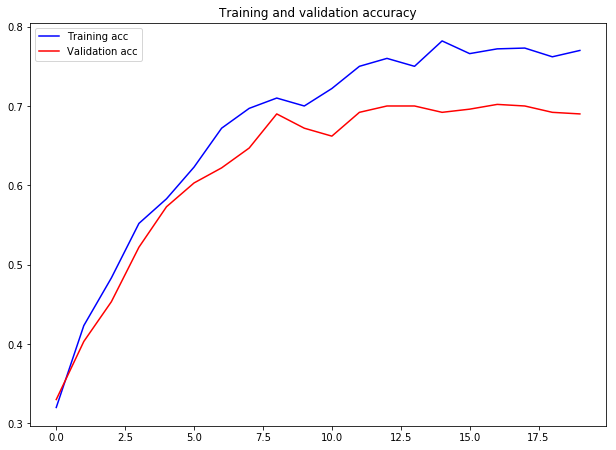

<Figure size 432x288 with 0 Axes>

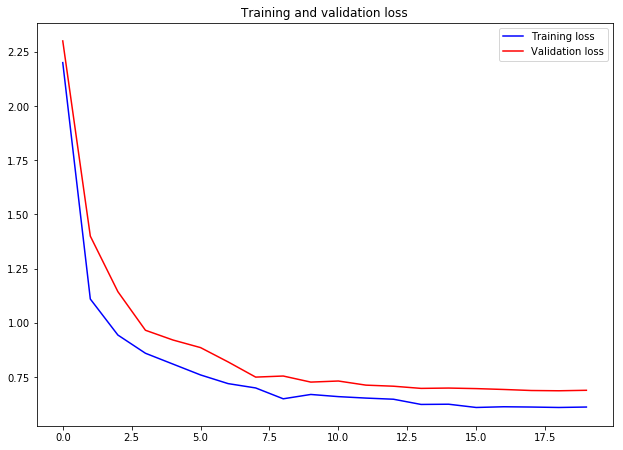

In [41]:
def visualize_results(history):
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))
 
    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()
visualize_results(history_1)


# 5. Final Model Prepapration (Fine-tuned with VGG-Imagenet)

In [36]:
# Initialize the VGG model

vgg = VGG16(
    include_top=False, weights='imagenet', input_tensor=None, input_shape= (150,150,3),
)

# Freeze all the layers
for layer in vgg.layers[:]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg.layers:
    print(layer, layer.trainable)
    


<keras.engine.input_layer.InputLayer object at 0x00000206BC5224E0> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD5AEB70> False
<keras.layers.convolutional.Conv2D object at 0x00000206BC5226A0> False
<keras.layers.pooling.MaxPooling2D object at 0x00000206BD8CBE10> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD8E5668> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD927518> False
<keras.layers.pooling.MaxPooling2D object at 0x00000206BD93DE80> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD93DEF0> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD96AC50> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD98F518> False
<keras.layers.pooling.MaxPooling2D object at 0x00000206BD9B2FD0> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD9B2940> False
<keras.layers.convolutional.Conv2D object at 0x00000206BD9DE278> False
<keras.layers.convolutional.Conv2D object at 0x00000206BDA00B70> False
<ker

In [29]:

# Create the model
model_2 = Sequential()

# Add the vgg convolutional base model
model_2.add(vgg)
# for layer in vgg.layers[1:]:
#     model.add(layer)


# Add new layers
model_2.add(Flatten())
model_2.add(Dense(64, activation='relu', kernel_regularizer=l2(0.01)))
model_2.add(Dropout(0.5))
model_2.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01)))

# Show a summary of the model. Check the number of trainable parameters
model_2.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_6 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 64)                524352    
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 65        
Total params: 15,239,105
Trainable params: 524,417
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
plot_model(model_2, to_file='model_plot.png', show_shapes=True, show_layer_names=True)


## 5.a. Training Final Model

In [26]:
batch_size = 16

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)


test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'train_data',  
        target_size=(224, 224),  
        batch_size=batch_size,
        class_mode='binary')  

validation_generator = test_datagen.flow_from_directory(
        'val_data',
        target_size=(224,224),
        batch_size=batch_size,
        class_mode='binary')

Found 723248 images belonging to 2 classes.
Found 173299 images belonging to 2 classes.


In [1]:

model_2.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])


history_2 = model_2.fit(
      train_generator,
      steps_per_epoch=
         (train_generator.samples/train_generator.batch_size),
      epochs=1,
      validation_data=validation_generator, 
      validation_steps=
         (validation_generator.samples/validation_generator.batch_size),
      verbose=1)

NameError: name 'model_2' is not defined

## 5.b. Visualize Final Results

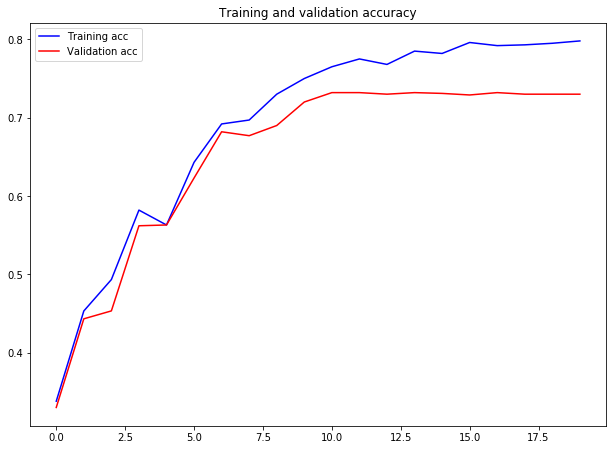

<Figure size 432x288 with 0 Axes>

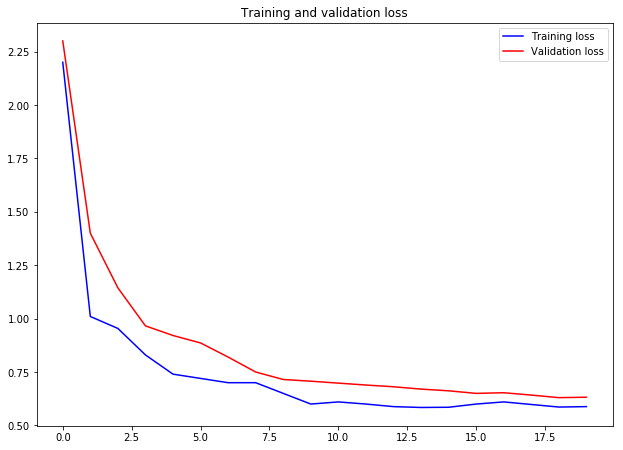

In [40]:

def visualize_results(history):
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()

visualize_results(history_2)